# Network Analysis of cross-border banking exposures
The typical structure of an Informatics MSc thesis:
- Title page with abstract.
- **Introduction** : an introduction to the document, clearly stating the <font color='red'>hypothesis or objective</font> of the project, <font color='red'>motivation</font> for the work and the <font color='red'>results</font> achieved. The <font color='red'>structure of the remainder</font> of the document should also be outlined.
- **Background** : background to the project, <font color='red'>previous work</font>, exposition of <font color='red'>relevant literature</font>, <font color='red'>setting of the work</font> in the proper context. This should contain sufficient information to <font color='red'>allow the reader to appreciate the contribution you have made</font>.
  - Keep the sections on Introduction and Background brief. Mention only background and related work that is necessary to understand and evaluate your work. (E.g., <font color='red'>definitions</font> what are used later in your theorems/proofs, or <font color='red'>data on the performance of other methods</font> so that you can compare it to your results.)
- **Description of the work undertaken** : this may be divided into chapters describing the <font color='red'>conceptual design work</font> and the <font color='red'>actual implementation</font> separately. Any <font color='red'>problems or difficulties</font> and the <font color='red'>suggested solutions</font> should be mentioned. <font color='red'>Alternative solutions and their evaluation</font> should also be included.
- **Analysis or Evaluation** : results and their critical analysis should be reported, whether the results conform to expectations or otherwise and how they compare with other related work. Where appropriate evaluation of the work against the original objectives should be presented.
- **Conclusion** : concluding remarks and observations, unsolved problems, suggestions for further work.
- **Bibliography**.

Projects are assessed in terms of a number of basic and other criteria:
- Basic Criteria
  - Understanding of the problem
  - Completion of the work
  - Quality of the work
  - Quality of the dissertation
- Additional Criteria
  - Knowledge of the literature
  - Critical evaluation of previous work
  - Critical evaluation of own work
  - Justification of design decisions
  - Solution of conceptual problems
  - Amount of work
- Exceptional Criteria
  - Evidence of outstanding merit e.g. originality
  - Inclusion of material worthy of publication

Project Introduction:
- The cross-border banking exposures are double-edged swords, which can improve the efficiency of global capital and resource allocation, but may also cause cascading contagions to form a global financial crisis.
- This study will first <font color='red'>transform related exposure data into temporal networks</font> with banks as nodes and exposures as links, then perform <font color='red'>standard analysis with basic network properties</font> and <font color='red'>detailed analysis through community detection by stochastic block models</font>.
- It aims to gain insights on how systematic risk changes over time and how we can find it, which can finally benefit decision-makers in the financial industry.

## Environment

- graph-tool
  - https://graph-tool.skewed.de/static/doc/index.html

### Install Graph-tool

In [1]:
## packages
import sys
import os
import zipfile as zp

# graph-tool https://git.skewed.de/count0/graph-tool/-/wikis/installation-instructions
if 'graph_tool.all' not in sys.modules:
    print('*** install graph-tool')
    !conda install -c conda-forge graph-tool -v -y
    print('*** finish!!!')

import numpy as np
import pandas as pd
# pd.set_option('display.float_format', lambda x: '%.3f' % x)
import matplotlib as mpl
import matplotlib.pyplot as plt

!pip install --upgrade scipy networkx
import networkx as nx
print("networkx: " + nx.__version__)

import graph_tool.all as gt
print("graph-tool: " + gt.__version__)


*** install graph-tool
/opt/conda/lib/python3.9/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "
Solving environment: ...working... 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - conda-forge/noarch::alembic==1.7.7=pyhd8ed1ab_0
  - conda-forge/linux-64::anyio==3.5.0=py39hf3d152e_0
  - conda-forge/noarch::argon2-cffi==21.3.0=pyhd8ed1ab_0
  - conda-forge/linux-64::argon2-cffi-bindings==21.2.0=py39hb9d737c_2
  - conda-forge/noarch::asttokens==2.0.5=pyhd8ed1ab_0
  - conda-forge/noarch::async_generator==1.10=py_0
  - conda-forge/noarch::attrs==21.4.0=pyhd8ed1ab_0
  - conda-forge/noarch::babel==2.9.1=pyh44b312d_0
  - conda-forge/noarch::backcall==0.2.0=pyh9f0ad1d_0
  - conda-forge/noarch::backport

### Test Graph-tool and Networkx


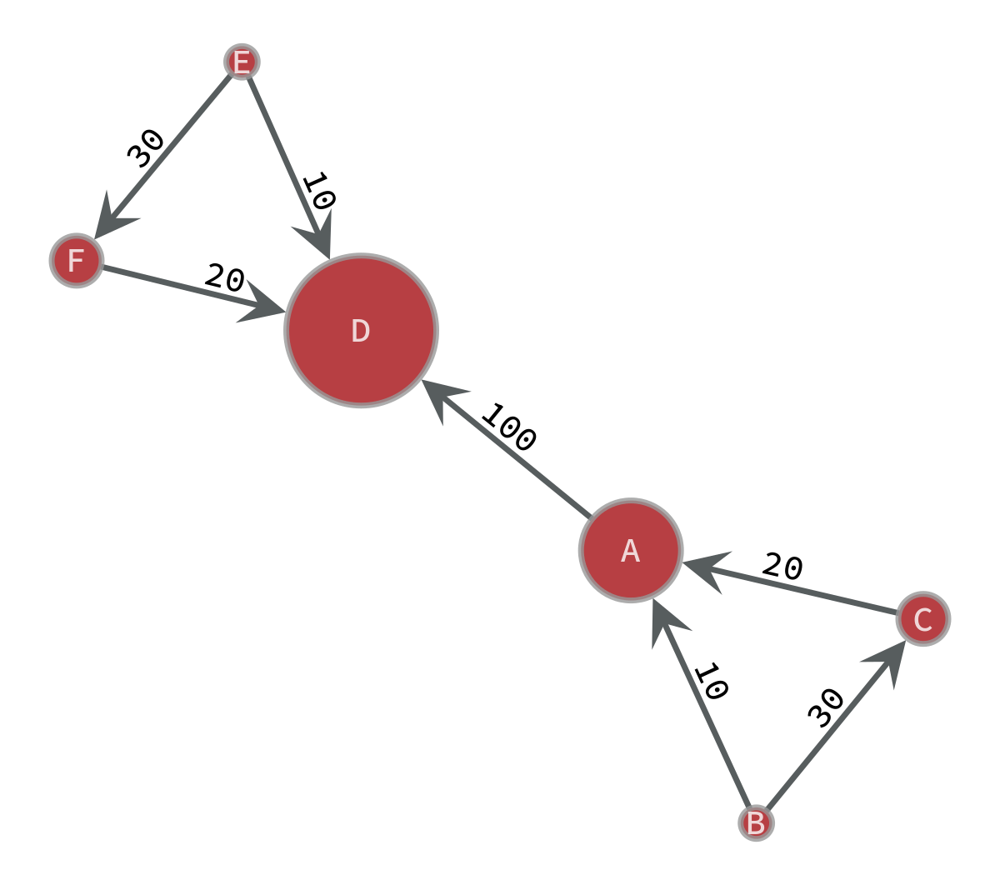

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc85dfc9700, at 0x7fc85dfce520>

In [2]:
g_gt = gt.Graph(directed=True)

v_A = g_gt.add_vertex()
v_B = g_gt.add_vertex()
v_C = g_gt.add_vertex()
v_D = g_gt.add_vertex()
v_E = g_gt.add_vertex()
v_F = g_gt.add_vertex()
g_gt.vp.name = g_gt.new_vertex_property("string")
g_gt.vp.name[v_A] = "A"
g_gt.vp.name[v_B] = "B"
g_gt.vp.name[v_C] = "C"
g_gt.vp.name[v_D] = "D"
g_gt.vp.name[v_E] = "E"
g_gt.vp.name[v_F] = "F"

e_BA = g_gt.add_edge(v_B, v_A)
e_CA = g_gt.add_edge(v_C, v_A)
e_BC = g_gt.add_edge(v_B, v_C)
e_ED = g_gt.add_edge(v_E, v_D)
e_FD = g_gt.add_edge(v_F, v_D)
e_EF = g_gt.add_edge(v_E, v_F)
e_AD = g_gt.add_edge(v_A, v_D)
g_gt.ep.weight = g_gt.new_edge_property("double")
g_gt.ep.weight[e_BA] = 10
g_gt.ep.weight[e_CA] = 20
g_gt.ep.weight[e_BC] = 30
g_gt.ep.weight[e_ED] = 10
g_gt.ep.weight[e_FD] = 20
g_gt.ep.weight[e_EF] = 30
g_gt.ep.weight[e_AD] = 100

deg = g_gt.degree_property_map('in')
deg.a = 30*deg.a
gt.graph_draw(g_gt,
              vertex_text = g_gt.properties[('v', 'name')], vertex_size=deg,
              edge_text = g_gt.properties[('e', 'weight')])

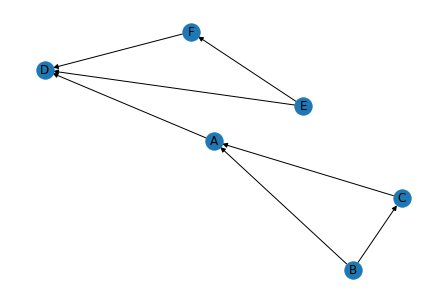

In [3]:
g_nx = nx.DiGraph()
g_nx.add_weighted_edges_from([('B', 'A', 10), ('C', 'A', 20), ('B', 'C', 30),
                   ('E', 'D', 10), ('F', 'D', 20), ('E', 'F', 30),
                   ('A', 'D', 100)])
nx.draw(g_nx, with_labels=True)

In [4]:
print(nx.is_directed(g_nx))
print(nx.is_weighted(g_nx))
print(nx.number_of_nodes(g_nx))
print(nx.number_of_edges(g_nx))
print(nx.density(g_nx))
print(g_nx.in_degree('A'))
print(g_nx.out_degree('A'))
print(g_nx.degree('A'))
print(g_nx.in_degree('A', weight='weight'))
print(g_nx.out_degree('A', weight='weight'))
print(g_nx.degree('A', weight='weight'))
print(nx.is_weakly_connected(g_nx))
print(nx.is_strongly_connected(g_nx))
print(nx.average_shortest_path_length(g_nx.to_undirected(), weight='weight'))
def nx_diameter_with_weight(G, weight_str):
    diameters = []
    for node in G.nodes():
        shortest_paths = nx.single_source_dijkstra(G, source=node, weight=weight_str)[0]
        max_shortest_path = max(shortest_paths.values())
        diameters.append(max_shortest_path)
    return max(diameters)
print(nx_diameter_with_weight(g_nx.to_undirected(), 'weight'))
print(nx.clustering(g_nx, 'A'))

True
True
6
7
0.23333333333333334
2
1
3
30
100
130
True
False
80.0
140
0.16666666666666666


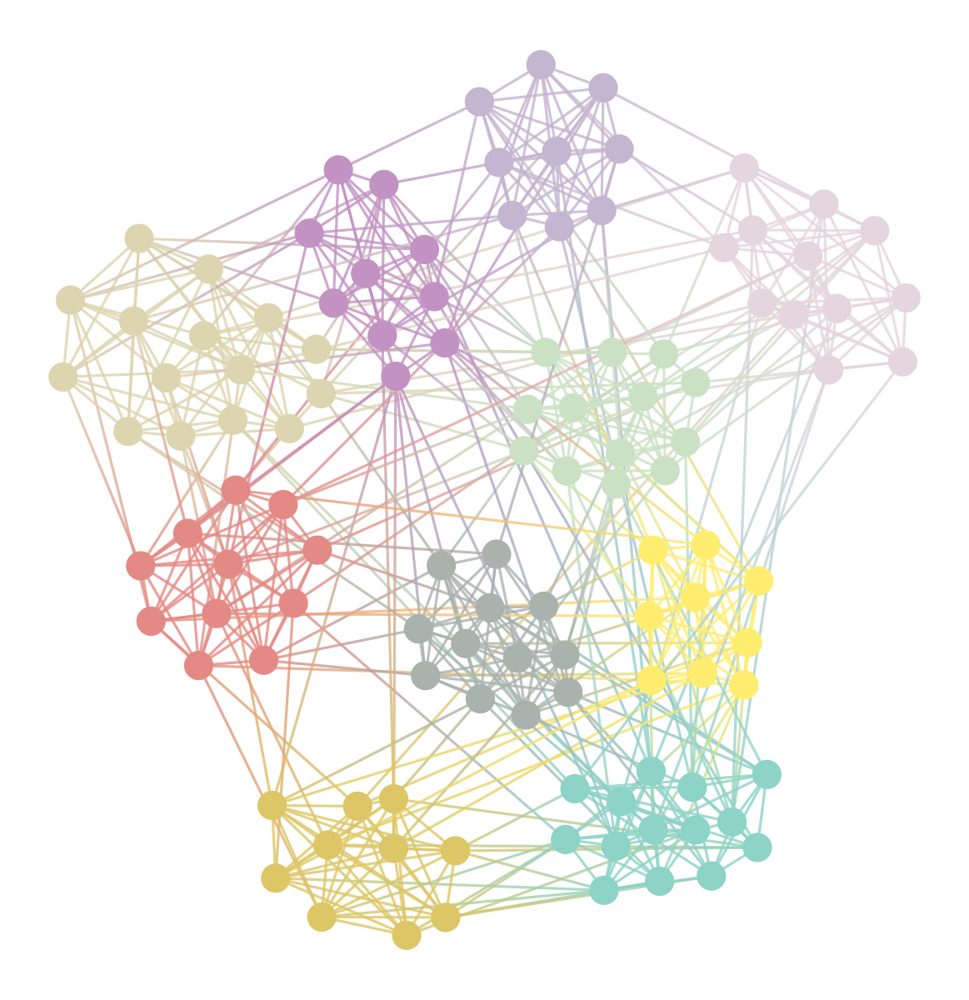

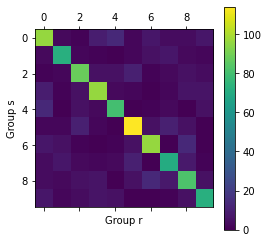

In [5]:
# SBMs
g_gt = gt.collection.data["football"]
state = gt.minimize_blockmodel_dl(g_gt)
state.draw(pos=g_gt.vp.pos)

b = gt.contiguous_map(state.get_blocks())
state = state.copy(b=b)
e = state.get_matrix()
B = state.get_nonempty_B()
plt.matshow(e.todense()[:B, :B], cmap='viridis')
plt.xlabel('Group r')
plt.ylabel('Group s')
plt.colorbar()
plt.show()

## Data

### Import FNA Data

In [6]:
## data
zip_path = 'FNA network.zip'
dir = 'FNA network'
if not os.path.exists(dir):
    print('*** unzip data.zip')
    with zp.ZipFile(zip_path) as arc:
        arc.extractall()

file_list = os.listdir(dir)
file_list.sort()

print(len(file_list))
file_list

27


['20150331.csv',
 '20150630.csv',
 '20150930.csv',
 '20151231.csv',
 '20160331.csv',
 '20160630.csv',
 '20160930.csv',
 '20161231.csv',
 '20170331.csv',
 '20170630.csv',
 '20170930.csv',
 '20171231.csv',
 '20180331.csv',
 '20180630.csv',
 '20180930.csv',
 '20181231.csv',
 '20190331.csv',
 '20190630.csv',
 '20190930.csv',
 '20191231.csv',
 '20200331.csv',
 '20200630.csv',
 '20200930.csv',
 '20201231.csv',
 '20210331.csv',
 '20210630.csv',
 '20210930.csv']

In [7]:
time_list = []
for file_name in file_list:
    time_list.append(file_name.replace('.csv',''))

### Data Inspect

In [8]:
# pd_inspect
pd_inspect = pd.read_csv(dir + '/' + file_list[0])

print(pd_inspect.shape)
print(pd_inspect.columns)
pd_inspect.head()

(406, 21)
Index(['net_id', 'arc_id', 'from_id', 'to_id', 'borrower', 'claims_held',
       'claims_held_10_change', 'claims_held_10_change_max',
       'claims_held_10_change_min', 'claims_held_2_change',
       'claims_held_2_change_max', 'claims_held_2_change_min',
       'claims_held_5_change', 'claims_held_5_change_max',
       'claims_held_5_change_min', 'claims_held_max', 'claims_held_min',
       'lender', 'share_of_claims_held', 'share_of_claims_held_max',
       'share_of_claims_held_min'],
      dtype='object')


,net_id,arc_id,from_id,to_id,borrower,claims_held,claims_held_10_change,claims_held_10_change_max,claims_held_10_change_min,claims_held_2_change,...,claims_held_2_change_min,claims_held_5_change,claims_held_5_change_max,claims_held_5_change_min,claims_held_max,claims_held_min,lender,share_of_claims_held,share_of_claims_held_max,share_of_claims_held_min
0,2015/3/31,AT-AU-0,AT,AU,Austria,5.220850e+08,NaN,NaN,NaN,63385000.0,...,-1.244000e+09,-1.586615e+09,6.050000e+08,-2.894000e+09,3.436000e+09,4.450000e+08,Australia,0.005037,0.014129,0.003330
1,2015/3/31,AT-BE-0,AT,BE,Austria,1.750940e+09,NaN,NaN,NaN,87716000.0,...,-3.459000e+09,-1.177284e+09,1.641000e+09,-3.771637e+09,6.063000e+09,1.550000e+09,Belgium,0.016893,0.029052,0.011835
2,2015/3/31,AT-CA-0,AT,CA,Austria,8.363850e+08,NaN,NaN,NaN,-122939000.0,...,-6.610000e+08,-8.139390e+08,8.910000e+08,-1.297000e+09,2.204000e+09,7.510000e+08,Canada,0.008069,0.010148,0.005185
3,2015/3/31,AT-CH-0,AT,CH,Austria,6.733410e+09,NaN,NaN,NaN,551087000.0,...,-6.296000e+09,-6.938913e+09,6.476000e+09,-6.387000e+09,1.312600e+10,5.288694e+09,Switzerland,0.064963,0.081206,0.037446
4,2015/3/31,AT-CL-0,AT,CL,Austria,1.416100e+07,NaN,NaN,NaN,-7430000.0,...,-1.780000e+08,-4.543000e+07,3.300000e+07,-1.740000e+08,2.390000e+08,7.000000e+06,Chile,0.000137,0.001536,0.000051


In [9]:
print("borrower: len=" + str(len(pd_inspect['borrower'].unique())) +
                             ", array=" + np.array2string(pd_inspect['borrower'].unique()))
print("lender: len=" + str(len(pd_inspect['lender'].unique())) +
                              ", array=" + np.array2string(pd_inspect['lender'].unique()))
print("arc_id: len=" + str(len(pd_inspect['arc_id'].unique())))

borrower: len=21, array=['Austria' 'Australia' 'Belgium' 'Canada' 'Switzerland' 'Chile' 'Germany'
 'Spain' 'Finland' 'France' 'United_Kingdom' 'Greece' 'Ireland' 'Italy'
 'Japan' 'South_Korea' 'Netherlands' 'Portugal' 'Sweden' 'Turkey'
 'United_States']
lender: len=22, array=['Australia' 'Belgium' 'Canada' 'Switzerland' 'Chile' 'Germany' 'Spain'
 'Finland' 'France' 'United_Kingdom' 'Greece' 'Ireland' 'India' 'Italy'
 'Japan' 'South_Korea' 'Netherlands' 'Portugal' 'Sweden' 'Turkey'
 'United_States' 'Austria']
arc_id: len=406


In [10]:
# pd_list: we only consider claims_held/USD
columns_key = ['arc_id','from_id','to_id','borrower','lender']
pd_claims_held_dict = {}
for one_time in time_list:
    pd_claims_held_dict[one_time] = pd.read_csv(dir + '/' + one_time + '.csv')[columns_key + ['claims_held']]

print(pd_claims_held_dict[time_list[0]].shape)
pd_claims_held_dict[time_list[0]].head()

(406, 6)


,arc_id,from_id,to_id,borrower,lender,claims_held
0,AT-AU-0,AT,AU,Austria,Australia,5.220850e+08
1,AT-BE-0,AT,BE,Austria,Belgium,1.750940e+09
2,AT-CA-0,AT,CA,Austria,Canada,8.363850e+08
3,AT-CH-0,AT,CH,Austria,Switzerland,6.733410e+09
4,AT-CL-0,AT,CL,Austria,Chile,1.416100e+07


In [11]:
# pd_merge
pd_claims_held_merge = pd_claims_held_dict[time_list[0]].rename(columns={'claims_held':time_list[0]})
for i in range(1, len(time_list)):
    pd_claims_held_merge = pd_claims_held_merge.merge(
      pd_claims_held_dict[time_list[i]].rename(columns={'claims_held':time_list[i]}), how='outer', on=columns_key)

print(pd_claims_held_merge.shape)
pd_claims_held_merge.head()

(417, 32)


,arc_id,from_id,to_id,borrower,lender,20150331,20150630,20150930,20151231,20160331,...,20190630,20190930,20191231,20200331,20200630,20200930,20201231,20210331,20210630,20210930
0,AT-AU-0,AT,AU,Austria,Australia,5.220850e+08,5.084990e+08,4.856030e+08,4.644340e+08,5.175790e+08,...,7.276380e+08,7.059820e+08,6.804890e+08,6.906940e+08,8.673920e+08,7.464550e+08,7.066430e+08,5.567450e+08,5.362950e+08,4.686770e+08
1,AT-BE-0,AT,BE,Austria,Belgium,1.750940e+09,1.849885e+09,1.628480e+09,1.658547e+09,1.913879e+09,...,1.779613e+09,2.025959e+09,2.038951e+09,2.471685e+09,2.676054e+09,2.576757e+09,2.456031e+09,2.479068e+09,2.659388e+09,2.712196e+09
2,AT-CA-0,AT,CA,Austria,Canada,8.363850e+08,7.752660e+08,8.305000e+08,7.912120e+08,1.103028e+09,...,1.371020e+09,1.261644e+09,1.325207e+09,1.526138e+09,1.733183e+09,1.750037e+09,1.841479e+09,1.791729e+09,2.011624e+09,1.983479e+09
3,AT-CH-0,AT,CH,Austria,Switzerland,6.733410e+09,6.627628e+09,6.614905e+09,5.406037e+09,6.069540e+09,...,1.341007e+10,1.141622e+10,8.002445e+09,1.069121e+10,9.524585e+09,9.707074e+09,9.208257e+09,9.387236e+09,8.534151e+09,8.151934e+09
4,AT-CL-0,AT,CL,Austria,Chile,1.416100e+07,1.679800e+07,1.669500e+07,2.351900e+07,2.146300e+07,...,2.170100e+07,2.030500e+07,7.084000e+07,7.724400e+07,3.058500e+07,1.125200e+08,4.499800e+07,4.861500e+07,8.117600e+07,7.893600e+07


In [12]:
print("borrower: len=" + str(len(pd_claims_held_merge['borrower'].unique())) +
                             ", array=" + np.array2string(pd_claims_held_merge['borrower'].unique()))
print("lender: len=" + str(len(pd_claims_held_merge['lender'].unique())) +
                              ", array=" + np.array2string(pd_claims_held_merge['lender'].unique()))
print("arc_id: len=" + str(len(pd_claims_held_merge['arc_id'].unique())))

borrower: len=21, array=['Austria' 'Australia' 'Belgium' 'Canada' 'Switzerland' 'Chile' 'Germany'
 'Spain' 'Finland' 'France' 'United_Kingdom' 'Greece' 'Ireland' 'Italy'
 'Japan' 'South_Korea' 'Netherlands' 'Portugal' 'Sweden' 'Turkey'
 'United_States']
lender: len=22, array=['Australia' 'Belgium' 'Canada' 'Switzerland' 'Chile' 'Germany' 'Spain'
 'Finland' 'France' 'United_Kingdom' 'Greece' 'Ireland' 'India' 'Italy'
 'Japan' 'South_Korea' 'Netherlands' 'Portugal' 'Sweden' 'Turkey'
 'United_States' 'Austria']
arc_id: len=417


In [13]:
pd_claims_held_merge.describe()

,20150331,20150630,20150930,20151231,20160331,20160630,20160930,20161231,20170331,20170630,...,20190630,20190930,20191231,20200331,20200630,20200930,20201231,20210331,20210630,20210930
count,4.060000e+02,4.040000e+02,4.020000e+02,4.000000e+02,4.030000e+02,4.030000e+02,4.000000e+02,4.020000e+02,3.990000e+02,4.000000e+02,...,4.040000e+02,4.080000e+02,4.060000e+02,4.090000e+02,4.080000e+02,4.060000e+02,4.080000e+02,4.050000e+02,4.070000e+02,4.070000e+02
mean,3.896289e+10,3.901076e+10,3.891243e+10,3.747723e+10,3.899392e+10,3.907801e+10,3.890906e+10,3.724084e+10,3.936975e+10,4.033251e+10,...,4.290681e+10,4.239769e+10,4.212174e+10,4.559877e+10,4.526763e+10,4.642467e+10,4.743614e+10,4.938093e+10,4.875622e+10,4.882246e+10
std,1.150953e+11,1.145297e+11,1.137052e+11,1.122800e+11,1.170230e+11,1.190124e+11,1.191671e+11,1.171589e+11,1.217479e+11,1.220391e+11,...,1.347591e+11,1.366200e+11,1.376339e+11,1.541051e+11,1.467481e+11,1.483425e+11,1.516806e+11,1.610586e+11,1.576152e+11,1.614671e+11
min,3.400000e+04,3.500000e+04,1.700000e+04,1.600000e+04,2.400000e+04,3.000000e+03,1.900000e+04,2.000000e+03,2.000000e+03,1.600000e+04,...,3.200000e+04,1.000000e+03,6.000000e+03,5.000000e+03,2.000000e+03,2.500000e+04,2.000000e+03,2.000000e+03,8.000000e+03,4.000000e+03
25%,4.332500e+08,4.781960e+08,5.032530e+08,5.098255e+08,4.971165e+08,4.590000e+08,5.229000e+08,4.096500e+08,4.568110e+08,4.260468e+08,...,4.666802e+08,4.887218e+08,6.085820e+08,4.748340e+08,4.935000e+08,5.412948e+08,5.079855e+08,5.163610e+08,6.380995e+08,5.060000e+08
50%,3.905123e+09,4.170236e+09,4.025781e+09,4.016555e+09,4.500000e+09,4.102000e+09,4.315762e+09,3.635000e+09,4.241088e+09,4.421241e+09,...,5.037840e+09,5.039014e+09,5.142062e+09,5.083272e+09,4.759000e+09,5.074405e+09,4.720122e+09,4.948706e+09,5.030000e+09,4.564000e+09
75%,2.505605e+10,2.512682e+10,2.536450e+10,2.596236e+10,2.553878e+10,2.469195e+10,2.536008e+10,2.487500e+10,2.704789e+10,2.822338e+10,...,2.934108e+10,2.797351e+10,2.761575e+10,2.877100e+10,2.916425e+10,3.123221e+10,3.055900e+10,3.444372e+10,3.307950e+10,3.294450e+10
max,1.402600e+12,1.367110e+12,1.419200e+12,1.480200e+12,1.562440e+12,1.574080e+12,1.632530e+12,1.621990e+12,1.664630e+12,1.602110e+12,...,1.720280e+12,1.782080e+12,1.814070e+12,2.083960e+12,1.929570e+12,1.928240e+12,1.970800e+12,2.139220e+12,2.004560e+12,2.062660e+12


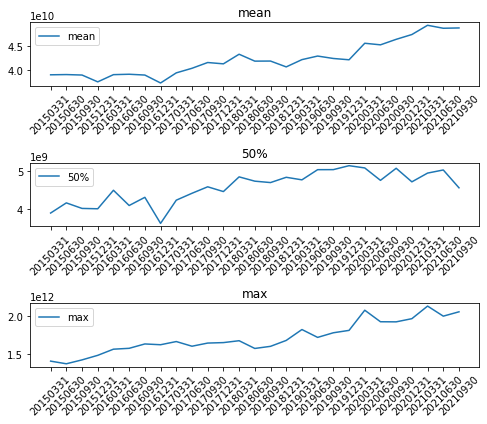

In [14]:
# we mainly consider mean, 50% and max in a time line
describe_focus = ['mean','50%','max']
pd_claims_held_merge_describe = pd_claims_held_merge.describe().T

fig, axs = plt.subplots(len(describe_focus),figsize=(7,6))

for i in range(0, len(describe_focus)):
    axs[i].plot(pd_claims_held_merge_describe[describe_focus[i]], label=describe_focus[i])
    axs[i].set_title(describe_focus[i])
    axs[i].xaxis.set_tick_params(rotation=45)
    axs[i].legend()

plt.tight_layout()
plt.show()

## Network Generation and Inspect
- To be convient, the unit for weight|claims_held is $10^9$ USD (billion)
- Mainly use networkx
- arrow: from-lender & to: borrower

### Network Generation

In [15]:
graphml_dir = 'FNA graphml'
if not os.path.exists(graphml_dir):
    print('*** generate graphml')
    os.makedirs(graphml_dir)
    for one_time in time_list:
        pd_claims_held_dict[one_time]['claims_held']/=10**9
        G = nx.from_pandas_edgelist(
            pd_claims_held_dict[one_time],
            source = 'lender', target = 'borrower',
            edge_attr='claims_held', create_using=nx.DiGraph())
        # add reciprocal
        for src, tar, wgt in G.edges.data('claims_held'):
            G.edges[src, tar]['claims_held_reciprocal'] = 1 / wgt
        nx.write_graphml_lxml(G, graphml_dir + "/" + one_time + ".graphml")

print("*** read graphml for nx")
G_nxs = {}
for one_time in time_list:
    G = nx.read_graphml(graphml_dir + "/" + one_time + ".graphml")
    print("nx time: " + one_time + ", nodes: " + str(G.number_of_nodes()) + ", edges: " + str(G.number_of_edges()))
    G_nxs[one_time] = G

print("*** read graphml for gt")
G_gts = {}
for one_time in time_list:
    G = gt.load_graph(graphml_dir + "/" + one_time + ".graphml")
    print("gt time: " + one_time + ", nodes: " + str(G.num_vertices()) + ", edges: " + str(G.num_edges()))
    G_gts[one_time] = G

*** read graphml for nx
nx time: 20150331, nodes: 22, edges: 406
nx time: 20150630, nodes: 22, edges: 404
nx time: 20150930, nodes: 22, edges: 402
nx time: 20151231, nodes: 22, edges: 400
nx time: 20160331, nodes: 22, edges: 403
nx time: 20160630, nodes: 22, edges: 403
nx time: 20160930, nodes: 22, edges: 400
nx time: 20161231, nodes: 22, edges: 402
nx time: 20170331, nodes: 22, edges: 399
nx time: 20170630, nodes: 22, edges: 400
nx time: 20170930, nodes: 22, edges: 401
nx time: 20171231, nodes: 22, edges: 402
nx time: 20180331, nodes: 22, edges: 401
nx time: 20180630, nodes: 22, edges: 403
nx time: 20180930, nodes: 22, edges: 405
nx time: 20181231, nodes: 22, edges: 402
nx time: 20190331, nodes: 22, edges: 407
nx time: 20190630, nodes: 22, edges: 404
nx time: 20190930, nodes: 22, edges: 408
nx time: 20191231, nodes: 22, edges: 406
nx time: 20200331, nodes: 22, edges: 409
nx time: 20200630, nodes: 22, edges: 408
nx time: 20200930, nodes: 22, edges: 406
nx time: 20201231, nodes: 22, edg

### Network inspect

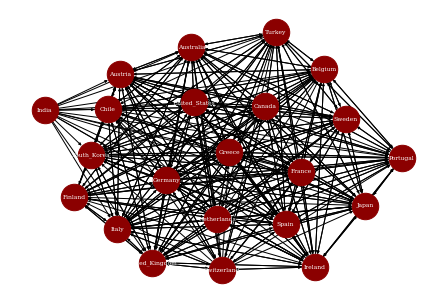

In [16]:
G_temp = G_nxs[time_list[0]]
# pos = nx.circular_layout(G_filt),
nx.draw(G_temp, with_labels=True,
        node_color='#8b0000', node_size=700,
        font_size=6, font_color='white', font_family='serif', font_weight='light',
        arrowsize=5, edge_color='black', width=1)

In [17]:
print(nx.is_strongly_connected(G_temp))
print(nx.is_weakly_connected(G_temp))

False
True


In [18]:
nx.number_strongly_connected_components(G_temp)

2

In [19]:
components = nx.strongly_connected_components(G_temp)
for c in components:
    print(c)

{'Austria', 'United_Kingdom', 'Switzerland', 'South_Korea', 'Germany', 'Sweden', 'Chile', 'Spain', 'Portugal', 'Japan', 'Canada', 'Finland', 'Turkey', 'Australia', 'United_States', 'Ireland', 'Italy', 'France', 'Belgium', 'Greece', 'Netherlands'}
{'India'}


### Inspect with Basic and Homogeneous Graph Statistics

In [20]:
G_nxs_statistics = {}
for name,G_nx in G_nxs.items():
    print("*** process ",name)
    statistics = {}
    # Number of nodes
    statistics['nodes'] = nx.number_of_nodes(G_nx)
    # Number of links
    statistics['links'] = nx.number_of_edges(G_nx)
    # Density
    statistics['density'] = nx.density(G_nx)
    # Average degrees (in-degree, out-degree, total degree)
    statistics['avg_in_degree'] = sum([x[1] for x in G_nx.in_degree()])/statistics['nodes']
    statistics['avg_out_degree'] = sum([x[1] for x in G_nx.out_degree()])/statistics['nodes']
    statistics['avg_total_degree'] = sum([x[1] for x in G_nx.degree()])/statistics['nodes']
    # Average strength (in-strength, out-strength, total strength)
    statistics['avg_in_strength'] = sum([x[1] for x in G_nx.in_degree(weight='claims_held')])/statistics['nodes']
    statistics['avg_out_strength'] = sum([x[1] for x in G_nx.out_degree(weight='claims_held')])/statistics['nodes']
    statistics['avg_total_strength'] = sum([x[1] for x in G_nx.degree(weight='claims_held')])/statistics['nodes']
    # Maximum strength (in-strength, out-strength, total strength)
    statistics['max_in_strength'] = max([x[1] for x in G_nx.in_degree(weight='claims_held')])
    statistics['max_out_strength'] = max([x[1] for x in G_nx.out_degree(weight='claims_held')])
    statistics['max_total_strength'] = max([x[1] for x in G_nx.degree(weight='claims_held')])
    # Average clustering coefficient
    statistics['avg_clus_coef'] = nx.average_clustering(G_nx)
    statistics['avg_clus_coef_weight'] = nx.average_clustering(G_nx, weight="claims_held")
    # Average path length for G_strong
    components = nx.strongly_connected_components(G_nx) # Identify all components.
    G_strong = nx.subgraph(G_nx, max(components, key = len)) # Subgraph the largest componenet.
    statistics['avg_path_length_for_strong'] = nx.average_shortest_path_length(G_strong)
    statistics['avg_path_length_weight_for_strong'] = nx.average_shortest_path_length(G_strong, weight='claims_held')
    # Diameter
    statistics['diameter_for_strong'] = nx.diameter(G_strong)
    statistics['diameter_weight_for_strong'] = nx_diameter_with_weight(G_strong, weight_str='claims_held')

    G_nxs_statistics[name] = statistics
print("finish")

*** process  20150331
*** process  20150630
*** process  20150930
*** process  20151231
*** process  20160331
*** process  20160630
*** process  20160930
*** process  20161231
*** process  20170331
*** process  20170630
*** process  20170930
*** process  20171231
*** process  20180331
*** process  20180630
*** process  20180930
*** process  20181231
*** process  20190331
*** process  20190630
*** process  20190930
*** process  20191231
*** process  20200331
*** process  20200630
*** process  20200930
*** process  20201231
*** process  20210331
*** process  20210630
*** process  20210930
finish


In [21]:
pd.DataFrame.from_dict(G_nxs_statistics, orient='index').T

,20150331,20150630,20150930,20151231,20160331,20160630,20160930,20161231,20170331,20170630,...,20190630,20190930,20191231,20200331,20200630,20200930,20201231,20210331,20210630,20210930
nodes,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,...,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
links,406.000000,404.000000,402.000000,400.000000,403.000000,403.000000,400.000000,402.000000,399.000000,400.000000,...,404.000000,408.000000,406.000000,409.000000,408.000000,406.000000,408.000000,405.000000,407.000000,407.000000
density,0.878788,0.874459,0.870130,0.865801,0.872294,0.872294,0.865801,0.870130,0.863636,0.865801,...,0.874459,0.883117,0.878788,0.885281,0.883117,0.878788,0.883117,0.876623,0.880952,0.880952
avg_in_degree,18.454545,18.363636,18.272727,18.181818,18.318182,18.318182,18.181818,18.272727,18.136364,18.181818,...,18.363636,18.545455,18.454545,18.590909,18.545455,18.454545,18.545455,18.409091,18.500000,18.500000
avg_out_degree,18.454545,18.363636,18.272727,18.181818,18.318182,18.318182,18.181818,18.272727,18.136364,18.181818,...,18.363636,18.545455,18.454545,18.590909,18.545455,18.454545,18.545455,18.409091,18.500000,18.500000
avg_total_degree,36.909091,36.727273,36.545455,36.363636,36.636364,36.636364,36.363636,36.545455,36.272727,36.363636,...,36.727273,37.090909,36.909091,37.181818,37.090909,36.909091,37.090909,36.818182,37.000000,37.000000
avg_in_strength,719.042366,716.379387,711.036157,681.404122,714.297744,715.838051,707.437403,680.491755,714.024134,733.318375,...,787.925090,786.284425,777.337604,847.722596,839.508807,856.746106,879.724690,909.058090,901.990000,903.215459
avg_out_strength,719.042366,716.379387,711.036157,681.404122,714.297744,715.838051,707.437403,680.491755,714.024134,733.318375,...,787.925090,786.284425,777.337604,847.722596,839.508807,856.746106,879.724689,909.058090,901.990000,903.215459
avg_total_strength,1438.084732,1432.758773,1422.072315,1362.808243,1428.595488,1431.676103,1414.874806,1360.983510,1428.048267,1466.636749,...,1575.850179,1572.568851,1554.675208,1695.445192,1679.017615,1713.492211,1759.449379,1818.116180,1803.980001,1806.430918
max_in_strength,2381.115900,2326.251300,2390.292600,2467.546100,2601.884100,2620.705300,2683.908000,2648.925800,2681.878700,2647.471400,...,2896.305200,2945.025900,2992.358400,3229.681000,3112.945500,3158.931800,3285.426100,3437.434000,3277.325700,3307.011700


In [22]:
pd.DataFrame.from_dict(G_nxs_statistics, orient='index').describe().T

,count,mean,std,min,25%,50%,75%,max
nodes,27.0,22.000000,0.000000,22.000000,22.000000,22.000000,22.000000,22.000000
links,27.0,404.000000,2.935198,399.000000,402.000000,404.000000,406.500000,409.000000
density,27.0,0.874459,0.006353,0.863636,0.870130,0.874459,0.879870,0.885281
avg_in_degree,27.0,18.363636,0.133418,18.136364,18.272727,18.363636,18.477273,18.590909
avg_out_degree,27.0,18.363636,0.133418,18.136364,18.272727,18.363636,18.477273,18.590909
avg_total_degree,27.0,36.727273,0.266836,36.272727,36.545455,36.727273,36.954545,37.181818
avg_in_strength,27.0,775.640146,69.507916,680.491755,716.108719,766.387224,814.280785,909.058090
avg_out_strength,27.0,775.640146,69.507916,680.491755,716.108719,766.387224,814.280785,909.058090
avg_total_strength,27.0,1551.280292,139.015833,1360.983510,1432.217438,1532.774448,1628.561570,1818.116180
max_in_strength,27.0,2837.377944,308.274066,2326.251300,2648.198600,2736.680000,3068.365750,3437.434000


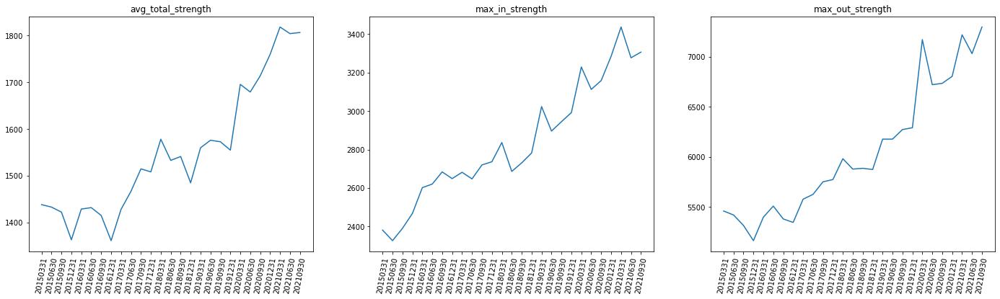

In [23]:
pd_temportal = pd.DataFrame.from_dict(G_nxs_statistics, orient='index').T
plt.figure(figsize = (24, 6))

plt.subplot(1, 3, 1)
plt.title('avg_total_strength')
plt.xticks(rotation = 80)
plt.plot(pd_temportal.columns.values, pd_temportal.loc['avg_total_strength'])

plt.subplot(1, 3, 2)
plt.title('max_in_strength')
plt.xticks(rotation = 80)
plt.plot(pd_temportal.columns.values, pd_temportal.loc['max_in_strength'])

plt.subplot(1, 3, 3)
plt.title('max_out_strength')
plt.xticks(rotation = 80)
plt.plot(pd_temportal.columns.values, pd_temportal.loc['max_out_strength'])

plt.show()

### Inspect with Heterogeneous Statistics

In [24]:
G_temp = G_nxs[time_list[0]]

In [25]:
def absolute_filter(G, k):
    G_filtered = nx.subgraph_view(G, filter_edge = lambda s, t: G.edges[s, t]['claims_held'] >= k)

    print(f"Filter loan amount >= {k:.0}:")
    print(f"\t{len(G_filtered.edges)} of {len(G.edges)} edges remain.")
    print(f"\tDensity: {nx.density(G_filtered):.3}")
    print("\tPaths between any node pair:", nx.is_strongly_connected(G_filtered))
    print("\tWeakly connected:", nx.is_weakly_connected(G_filtered))

    return G_filtered

G_1e0 = absolute_filter(G_temp, 1e0)
G_1e1 = absolute_filter(G_temp, 1e1)
G_1e2 = absolute_filter(G_temp, 1e2)
G_1e3 = absolute_filter(G_temp, 1e3)

Filter loan amount >= 1e+00:
	270 of 406 edges remain.
	Density: 0.584
	Paths between any node pair: False
	Weakly connected: True
Filter loan amount >= 1e+01:
	160 of 406 edges remain.
	Density: 0.346
	Paths between any node pair: False
	Weakly connected: True
Filter loan amount >= 1e+02:
	40 of 406 edges remain.
	Density: 0.0866
	Paths between any node pair: False
	Weakly connected: False
Filter loan amount >= 1e+03:
	1 of 406 edges remain.
	Density: 0.00216
	Paths between any node pair: False
	Weakly connected: False


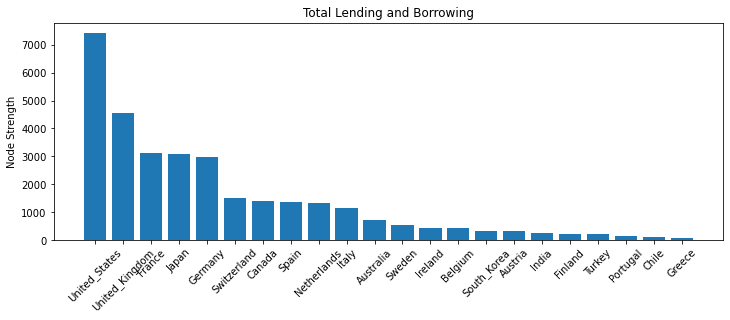

In [26]:
# Identify disconnected countries.
isolates = set(nx.isolates(G_temp))

# Calculate total lending and borrowing.
country_size = sorted(
    list(G_temp.degree(weight = 'claims_held')),
    key = lambda pair: pair[1],
    reverse = True)

plt.figure(figsize = (12, 4))
plt.title('Total Lending and Borrowing')
xticks = np.arange(len(country_size))
plt.bar(xticks, [0 if name in isolates else size for name, size in country_size])
plt.bar(xticks, [size if name in isolates else 0 for name, size in country_size])
plt.xticks(xticks, [name for name, size in country_size], rotation = 45)
plt.ylabel('Node Strength')
plt.show()

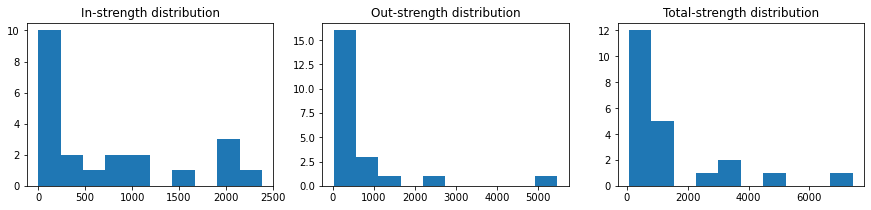

In [27]:
def plot_hist(degrees):
    plt.hist([deg for _, deg in degrees])

plt.figure(figsize = (15, 3))

plt.subplot(1, 3, 1)
plt.title('In-strength distribution')
plot_hist(G_temp.in_degree(weight='claims_held'))

plt.subplot(1, 3, 2)
plt.title('Out-strength distribution')
plot_hist(G_temp.out_degree(weight='claims_held'))

plt.subplot(1, 3, 3)
plt.title('Total-strength distribution')
plot_hist(G_temp.degree(weight='claims_held'))

plt.show()

In [28]:
def top_n(deg_dist, n=5):
    return [id for id, _ in sorted(deg_dist, key = lambda p: -p[1])][:n]

pd.DataFrame({
    'In-strength': top_n(G_temp.in_degree(weight='claims_held'),10),
    'Out-strength': top_n(G_temp.out_degree(weight='claims_held'),10),
    'Total-strength': top_n(G_temp.degree(weight='claims_held'),10)
}).T

,0,1,2,3,4,5,6,7,8,9
In-strength,Japan,United_Kingdom,France,United_States,Germany,Switzerland,Canada,Spain,Netherlands,Italy
Out-strength,United_States,United_Kingdom,Germany,France,Japan,Italy,Netherlands,Spain,Australia,Canada
Total-strength,United_States,United_Kingdom,France,Japan,Germany,Switzerland,Canada,Spain,Netherlands,Italy


In [29]:
score_closeness = nx.closeness_centrality(G_temp, distance='claims_held_reciprocal')

In [30]:
score_betweenness = nx.betweenness_centrality(G_temp, weight='claims_held_reciprocal')

In [31]:
pd.DataFrame({
    'Closeness': list(score_closeness.values()),
    'Betweenness': list(score_betweenness.values())
}).describe().T

,count,mean,std,min,25%,50%,75%,max
Closeness,22.0,27.279663,16.167909,0.0,10.985898,34.525204,41.838614,45.645066
Betweenness,22.0,0.071320,0.140220,0.0,0.000000,0.000000,0.069643,0.569048


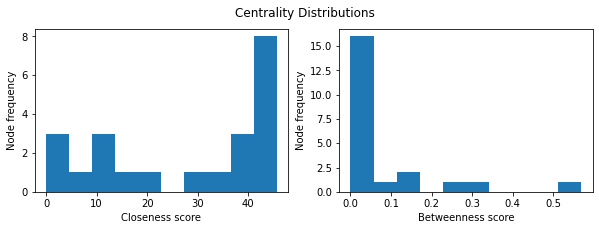

# nodes with zero closeness: 1 (4.5%)
# nodes with zero betweenness: 14 (63.6%)


In [32]:
plt.figure(figsize = (10, 3))

plt.suptitle('Centrality Distributions')

plt.subplot(1, 2, 1)
plt.hist(list(score_closeness.values()))
plt.xlabel('Closeness score')
plt.ylabel('Node frequency')

plt.subplot(1, 2, 2)
plt.hist(list(score_betweenness.values()))
plt.xlabel('Betweenness score')
plt.ylabel('Node frequency')

plt.show()

def count_zeros(name, dist):
    n_zero = sum(1 for i in dist if i <= 0)
    print(f"# nodes with zero {name}: {n_zero} ({n_zero/len(dist):.1%})")

count_zeros('closeness', score_closeness.values())
count_zeros('betweenness', score_betweenness.values())

In [33]:
pd.DataFrame({
    'In-strength': top_n(G_temp.in_degree(weight='claims_held'),10),
    'Out-strength': top_n(G_temp.out_degree(weight='claims_held'),10),
    'Total-strength': top_n(G_temp.degree(weight='claims_held'),10),
    'Closeness': top_n(score_closeness.items(),10),
    'Betweenness': top_n(score_betweenness.items(),10)
}).T

,0,1,2,3,4,5,6,7,8,9
In-strength,Japan,United_Kingdom,France,United_States,Germany,Switzerland,Canada,Spain,Netherlands,Italy
Out-strength,United_States,United_Kingdom,Germany,France,Japan,Italy,Netherlands,Spain,Australia,Canada
Total-strength,United_States,United_Kingdom,France,Japan,Germany,Switzerland,Canada,Spain,Netherlands,Italy
Closeness,France,Germany,United_States,Japan,United_Kingdom,Canada,Switzerland,Spain,Sweden,Netherlands
Betweenness,United_States,United_Kingdom,France,Germany,Spain,Sweden,Netherlands,Italy,Australia,Austria


### Inspect with Community Detection

_graphml_vertex_id         (vertex)  (type: string)
_graphml_edge_id           (edge)    (type: string)
claims_held                (edge)    (type: long double)
claims_held_reciprocal     (edge)    (type: long double)
None


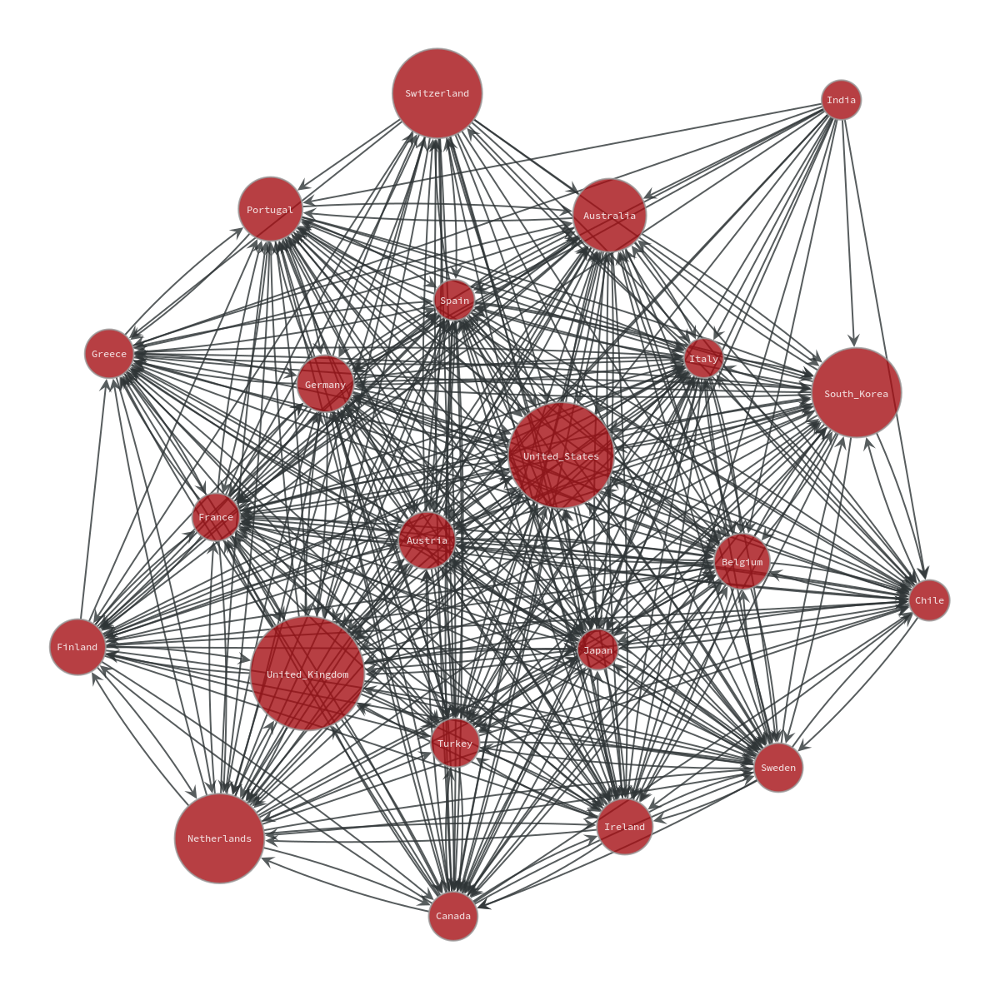

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc8196c86d0, at 0x7fc80a1c4f10>

In [34]:
G_temp = G_gts[time_list[0]]
print(G_temp.list_properties())
gt.graph_draw(G_temp,
              vertex_text = G_temp.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

1956.166187611734


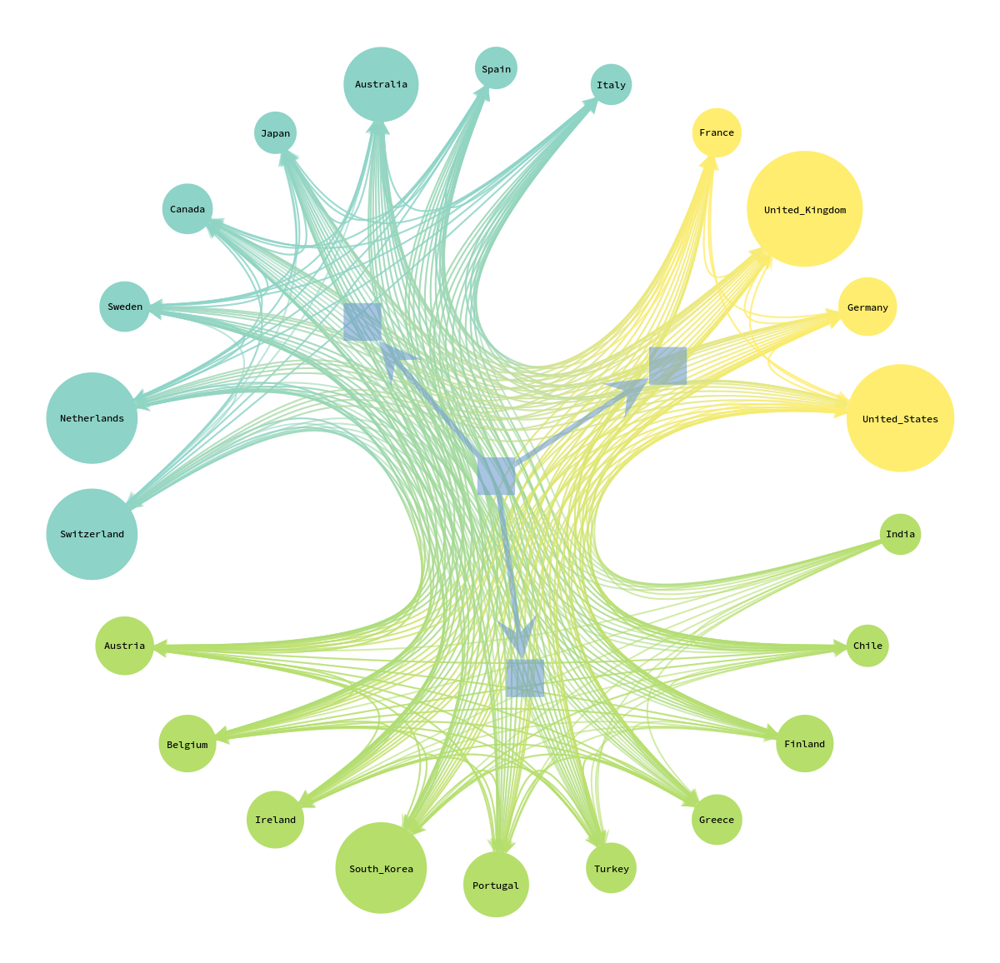

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc8196c86d0, at 0x7fc818df3be0>,
 <GraphView object, directed, with 26 vertices and 25 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fc818dfad00, at 0x7fc80a0cec10>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fc818dfad00, at 0x7fc80a0ce7f0>, False), at 0x7fc818dfad00>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc818dfad00, at 0x7fc80a0cedc0>)

In [35]:
state = gt.minimize_nested_blockmodel_dl(G_temp,
              state_args=dict(recs=[G_temp.properties[('e', 'claims_held')]], rec_types=["real-exponential"]))
print(state.entropy())
state.draw(vertex_text = G_temp.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

In [36]:
entropys = []
states = []
for i in range(10):
    state = gt.minimize_nested_blockmodel_dl(G_temp,
              state_args=dict(recs=[G_temp.properties[('e', 'claims_held')]], rec_types=["real-exponential"]))
    entropys.append(state.entropy())
    states.append(state)
pd.DataFrame({'entropys': entropys}).describe()

,entropys
count,10.000000
mean,1955.550070
std,9.986092
min,1941.017357
25%,1949.682928
50%,1956.166188
75%,1962.483771
max,1968.344881


4
1941.017357482232


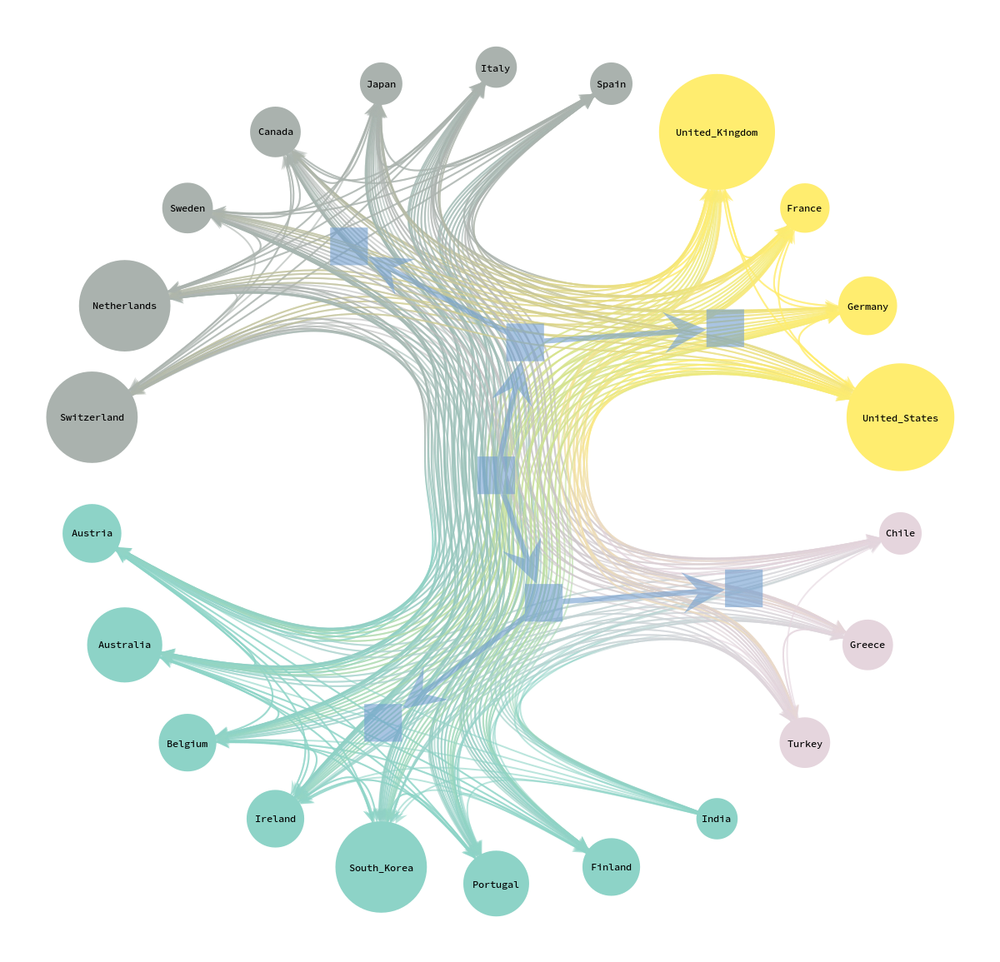

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc8196c86d0, at 0x7fc80983b8e0>,
 <GraphView object, directed, with 29 vertices and 28 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fc80a1e0220, at 0x7fc809840c70>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fc80a1e0220, at 0x7fc809840b50>, False), at 0x7fc80a1e0220>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc80a1e0220, at 0x7fc809840760>)

In [37]:
index = np.argmin(entropys)
print(index)
print(entropys[index])
states[index].draw(vertex_text = G_temp.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

In [38]:
levels = states[index].get_levels()
for s in levels:
    print(s)
    if s.get_N() == 1:
        break

<BlockState object with 22 blocks (4 nonempty), degree-corrected, with 1 edge covariate, for graph <Graph object, directed, with 22 vertices and 406 edges, 1 internal vertex property, 3 internal edge properties, at 0x7fc8196c86d0>, at 0x7fc8098faeb0>
<BlockState object with 4 blocks (2 nonempty), with 1 edge covariate, for graph <Graph object, directed, with 22 vertices and 16 edges, 2 internal vertex properties, 1 internal edge property, at 0x7fc809917340>, at 0x7fc80991ca90>
<BlockState object with 2 blocks (1 nonempty), with 1 edge covariate, for graph <Graph object, directed, with 4 vertices and 4 edges, 2 internal vertex properties, 1 internal edge property, at 0x7fc80991f670>, at 0x7fc80991c940>
<BlockState object with 1 blocks (1 nonempty), with 1 edge covariate, for graph <Graph object, directed, with 2 vertices and 1 edge, 2 internal vertex properties, 1 internal edge property, at 0x7fc8099235e0>, at 0x7fc80991fcd0>


## Risk Feature
- Inherent risk & Propagated risk

### Feature

In [39]:
feature_graphml_dir = 'FNA Feature graphml'
if not os.path.exists(feature_graphml_dir):
    print('*** generate feature graphml')
    os.makedirs(feature_graphml_dir)
    for one_time in time_list:
        G = nx.read_graphml(graphml_dir + "/" + one_time + ".graphml")
        in_strength = G.in_degree(weight = 'claims_held')
        out_strength = G.out_degree(weight = 'claims_held')
        # add norm
        for src, tar, wgt in G.edges.data('claims_held'):
            G.edges[src, tar]['claims_held_norm'] = wgt / out_strength[src]
            G.edges[src, tar]['claims_held_norm_reciprocal'] = 1 / G.edges[src, tar]['claims_held_norm']
        # add inherent risk
        for node in list(G.nodes(data=False)):
            G.nodes[node]['inherent_risk'] = in_strength[node] / out_strength[node]
        # add propagated risk
        propagated_risk = nx.pagerank(G = G.reverse(), # The lender has higher risk, so change the direction
                                      nstart = dict(G.nodes.data('inherent_risk')),
                                      weight = 'claims_held_norm')
        for node in list(G.nodes(data=False)):
            G.nodes[node]['propagated_risk'] = propagated_risk[node]
        nx.write_graphml_lxml(G, feature_graphml_dir + "/" + one_time + ".graphml")

print("*** read graphml for nx")
G_nxs_feature = {}
for one_time in time_list:
    G = nx.read_graphml(feature_graphml_dir + "/" + one_time + ".graphml")
    print("nx time: " + one_time
        + ", nodes: " + str(G.number_of_nodes())
        + ", edges: " + str(G.number_of_edges()))
    print("         " + one_time + ", node attrs: " + str(list(G.nodes.items())[0][1]))
    print("         " + one_time + ", edge attrs: " + str(list(G.edges.items())[0][1]))
    G_nxs_feature[one_time] = G

print("*** read graphml for gt")
G_gts_feature = {}
for one_time in time_list:
    G = gt.load_graph(feature_graphml_dir + "/" + one_time + ".graphml")
    print("gt time: " + one_time
        + ", nodes: " + str(G.num_vertices())
        + ", edges: " + str(G.num_edges()))
    print("         " + one_time
        + ", node attrs: " + str(dict(G.vertex_properties).keys()))
    print("         " + one_time
        + ", edge attrs: " + str(dict(G.edge_properties).keys()))
    G_gts_feature[one_time] = G

*** generate feature graphml
*** read graphml for nx
nx time: 20150331, nodes: 22, edges: 406
         20150331, node attrs: {'inherent_risk': 0.8359096223519187, 'propagated_risk': 0.036327899654037314}
         20150331, edge attrs: {'claims_held': 0.522085, 'claims_held_reciprocal': 1.9153969181263586, 'claims_held_norm': 0.0013394901122495205, 'claims_held_norm_reciprocal': 746.5527299194574}
nx time: 20150630, nodes: 22, edges: 404
         20150630, node attrs: {'inherent_risk': 0.8717347129552802, 'propagated_risk': 0.03620376543272468}
         20150630, edge attrs: {'claims_held': 0.508499, 'claims_held_reciprocal': 1.9665722056483885, 'claims_held_norm': 0.0013148449139959802, 'claims_held_norm_reciprocal': 760.5459696085932}
nx time: 20150930, nodes: 22, edges: 402
         20150930, node attrs: {'inherent_risk': 0.8581957826761578, 'propagated_risk': 0.03510313873428144}
         20150930, edge attrs: {'claims_held': 0.485603, 'claims_held_reciprocal': 2.0592953503170284, '

### Visualization

In [40]:
G_temp = G_nxs_feature[time_list[0]]

Filtered network: 60 edges remain out of 406


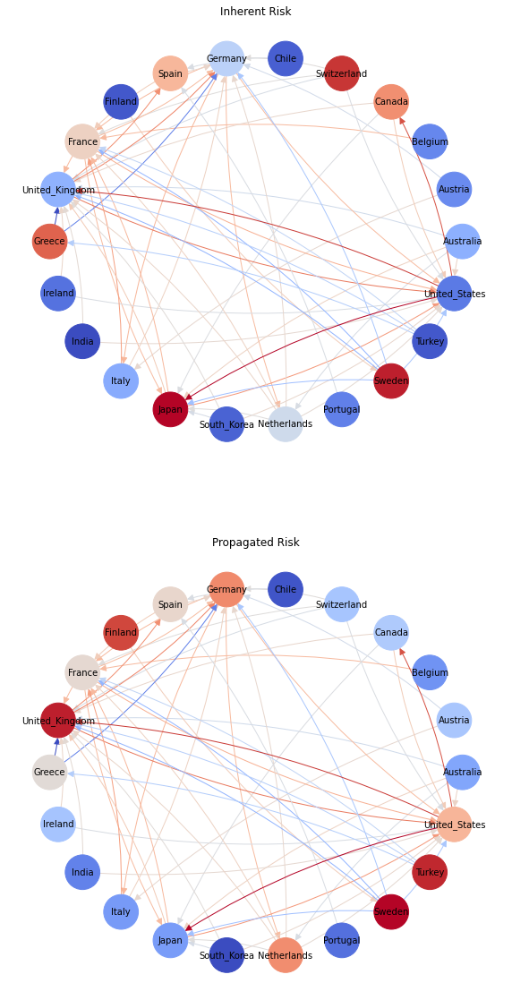

In [41]:
def disparity_filter(G, alpha):
    s = G.out_degree(weight = 'claims_held')
    k = G.out_degree(weight = None)

    def pij(i, j):
        w = G.edges[i, j]['claims_held']
        return ((1 - (w / s[i])) ** (k[i] - 1)) < alpha

    return nx.subgraph_view(G, filter_edge = pij)


G_filt = disparity_filter(G_temp, .1)
print('Filtered network:', len(G_filt.edges), 'edges remain out of', len(G_temp.edges))

plt.figure(3, figsize = (10, 20))
plt.subplot(2, 1, 1)
plt.title('Inherent Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('inherent_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")

plt.subplot(2, 1, 2)
plt.title('Propagated Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('propagated_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")
plt.show()

In [42]:
# Japan in
G_filt.in_edges('Japan',data='claims_held_norm')

InEdgeDataView([('Australia', 'Japan', 0.2630001866103677), ('Canada', 'Japan', 0.1632493233762417), ('France', 'Japan', 0.1583340820653159), ('South_Korea', 'Japan', 0.21206383293224682), ('Netherlands', 'Japan', 0.12801184163062135), ('Sweden', 'Japan', 0.1590112077574935), ('United_States', 'Japan', 0.25687145260347677)])

In [43]:
# Switzerland in
G_filt.in_edges('Switzerland',data='claims_held_norm')

InEdgeDataView([])

In [44]:
# Sweden in
G_filt.in_edges('Sweden',data='claims_held_norm')

InEdgeDataView([('Finland', 'Sweden', 0.6107958070101474)])

In [45]:
# Greece in
G_filt.in_edges('Greece',data='claims_held_norm')

InEdgeDataView([('Turkey', 'Greece', 0.15875132337244569)])

In [46]:
G_filt.out_edges('United_States',data='claims_held_norm')

OutEdgeDataView([('United_States', 'Canada', 0.1410859036275138), ('United_States', 'United_Kingdom', 0.17598350025983786), ('United_States', 'Japan', 0.25687145260347677)])

## Static Analysis

### Different insights from previous networks

#### Distribution for total normalized lending and borrowing

In [47]:
G_temp = G_nxs_feature[time_list[0]]

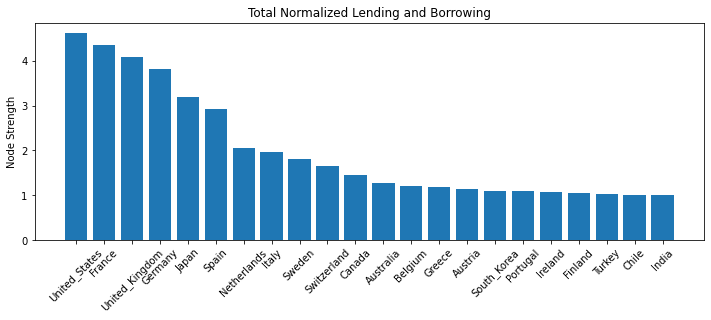

In [48]:
# Identify disconnected countries.
isolates = set(nx.isolates(G_temp))

# Calculate total strength.
country_size = sorted(
    list(G_temp.degree(weight = 'claims_held_norm')),
    key = lambda pair: pair[1],
    reverse = True)

plt.figure(figsize = (12, 4))
plt.title('Total Normalized Lending and Borrowing')
xticks = np.arange(len(country_size))
plt.bar(xticks, [0 if name in isolates else size for name, size in country_size])
plt.bar(xticks, [size if name in isolates else 0 for name, size in country_size])
plt.xticks(xticks, [name for name, size in country_size], rotation = 45)
plt.ylabel('Node Strength')
plt.show()

#### Central Nodes

In [49]:
score_closeness = nx.closeness_centrality(G_temp, distance='claims_held_norm_reciprocal')
score_betweenness = nx.betweenness_centrality(G_temp, weight='claims_held_norm_reciprocal')

pd.DataFrame({
    'In-strength': top_n(G_temp.in_degree(weight='claims_held_norm'),10),
    'Out-strength': top_n(G_temp.out_degree(weight='claims_held_norm'),10),
    'Total-strength': top_n(G_temp.degree(weight='claims_held_norm'),10),
    'Closeness': top_n(score_closeness.items(),10),
    'Betweenness': top_n(score_betweenness.items(),10)
}).T

,0,1,2,3,4,5,6,7,8,9
In-strength,United_States,France,United_Kingdom,Germany,Japan,Spain,Netherlands,Italy,Sweden,Switzerland
Out-strength,Spain,Australia,Belgium,Switzerland,Germany,France,Finland,United_Kingdom,India,South_Korea
Total-strength,United_States,France,United_Kingdom,Germany,Japan,Spain,Netherlands,Italy,Sweden,Switzerland
Closeness,United_States,France,United_Kingdom,Germany,Japan,Spain,Canada,Netherlands,Italy,Switzerland
Betweenness,United_Kingdom,Germany,France,United_States,Spain,Netherlands,Sweden,Japan,Italy,Greece


#### Communities

In [50]:
G_temp = G_gts_feature[time_list[0]]

In [51]:
entropys = []
states = []
for i in range(10):
  state = gt.minimize_nested_blockmodel_dl(G_temp,
              state_args=dict(recs=[G_temp.properties[('e', 'claims_held_norm_reciprocal')]], rec_types=["real-exponential"]))
  entropys.append(state.entropy())
  states.append(state)
pd.DataFrame({'entropys': entropys}).describe()

,entropys
count,10.000000
mean,3677.656510
std,93.886704
min,3616.473103
25%,3616.769599
50%,3616.769599
75%,3712.106115
max,3880.131417


8
3616.473102697209


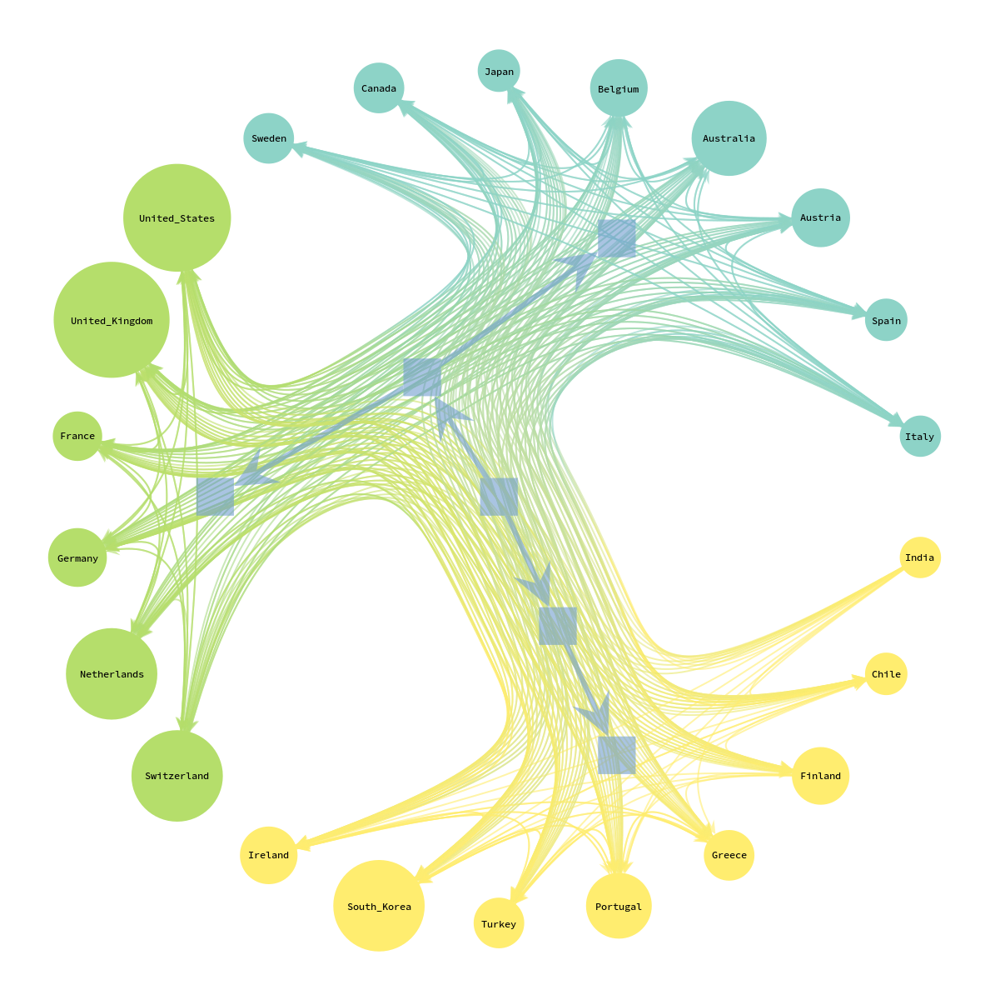

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc80a1a5820, at 0x7fc80976e250>,
 <GraphView object, directed, with 28 vertices and 27 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fc80976e340, at 0x7fc8097382e0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fc80976e340, at 0x7fc80976cf70>, False), at 0x7fc80976e340>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc80976e340, at 0x7fc80976cdc0>)

In [52]:
index = np.argmin(entropys)
print(index)
print(entropys[index])
states[index].draw(vertex_text = G_temp.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

### Cross-sectional Analysis

#### Inherent and Propagated Risks

In [53]:
# 2021.03.31 within COVID-19
G_temp = G_nxs_feature['20210331']

Filtered network: 64 edges remain out of 405


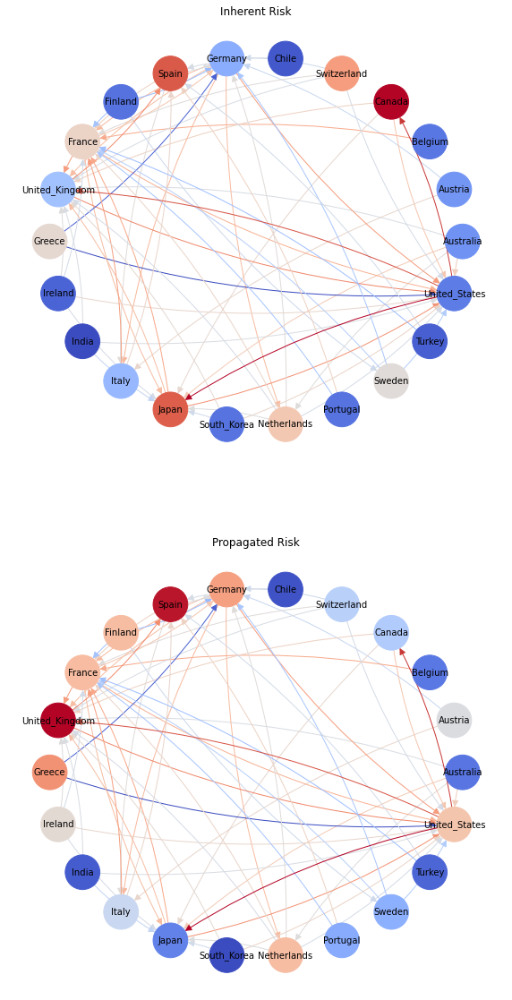

In [54]:
def disparity_filter(G, alpha):
    s = G.out_degree(weight = 'claims_held')
    k = G.out_degree(weight = None)

    def pij(i, j):
        w = G.edges[i, j]['claims_held']
        return ((1 - (w / s[i])) ** (k[i] - 1)) < alpha

    return nx.subgraph_view(G, filter_edge = pij)


G_filt = disparity_filter(G_temp, .1)
print('Filtered network:', len(G_filt.edges), 'edges remain out of', len(G_temp.edges))

plt.figure(3, figsize = (10, 20))
plt.subplot(2, 1, 1)
plt.title('Inherent Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('inherent_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")

plt.subplot(2, 1, 2)
plt.title('Propagated Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('propagated_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")
plt.show()

In [55]:
pd.DataFrame({
    'inherent_risk': [id for id,  wgt in sorted(G_filt.nodes.data('inherent_risk'), key = lambda p: -p[1])][:15],
    'propagated': [id for id,  wgt in sorted(G_filt.nodes.data('propagated_risk'), key = lambda p: -p[1])][:15]
}).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
inherent_risk,Canada,Spain,Japan,Switzerland,Netherlands,France,Greece,Sweden,United_Kingdom,Italy,Germany,Austria,Australia,United_States,Belgium
propagated,United_Kingdom,Spain,Greece,Germany,France,Finland,Netherlands,United_States,Ireland,Austria,Italy,Switzerland,Canada,Sweden,Portugal


In [56]:
G_filt.in_edges(['Spain'], data='claims_held')

InEdgeDataView([('Chile', 'Spain', 66.549508), ('United_Kingdom', 'Spain', 498.325), ('Italy', 'Spain', 109.265), ('Portugal', 'Spain', 124.96), ('Turkey', 'Spain', 59.869408)])

In [57]:
G_filt.out_edges(['Portugal'], data='claims_held_norm')

OutEdgeDataView([('Portugal', 'Spain', 0.7036374304976443), ('Portugal', 'France', 0.14089078223816867)])

In [58]:
G_filt.out_edges(['Greece'], data='claims_held_norm')

OutEdgeDataView([('Greece', 'Germany', 0.22919726293271056), ('Greece', 'United_States', 0.16489579329754392)])

### Time series Analysis

#### Communities

In [59]:
G_20190331 = G_gts_feature['20190331']
G_20210331 = G_gts_feature['20210331']

In [60]:
entropys_20190331 = []
states_20190331 = []
entropys_20210331 = []
states_20210331 = []
for i in range(10):
    state = gt.minimize_nested_blockmodel_dl(G_20190331,
              state_args=dict(recs=[G_20190331.properties[('e', 'claims_held_norm_reciprocal')]], rec_types=["real-exponential"]))
    entropys_20190331.append(state.entropy())
    states_20190331.append(state)
for i in range(10):
    state = gt.minimize_nested_blockmodel_dl(G_20210331,
              state_args=dict(recs=[G_20210331.properties[('e', 'claims_held_norm_reciprocal')]], rec_types=["real-exponential"]))
    entropys_20210331.append(state.entropy())
    states_20210331.append(state)
pd.DataFrame({'entropys_20190331': entropys_20190331, 'entropys_20210331':entropys_20210331}).describe().T

,count,mean,std,min,25%,50%,75%,max
entropys_20190331,10.0,3648.298268,40.483176,3606.227104,3616.253145,3636.570287,3678.204710,3719.649394
entropys_20210331,10.0,3632.736994,117.436178,3591.627352,3591.627352,3591.627352,3603.667324,3966.256348


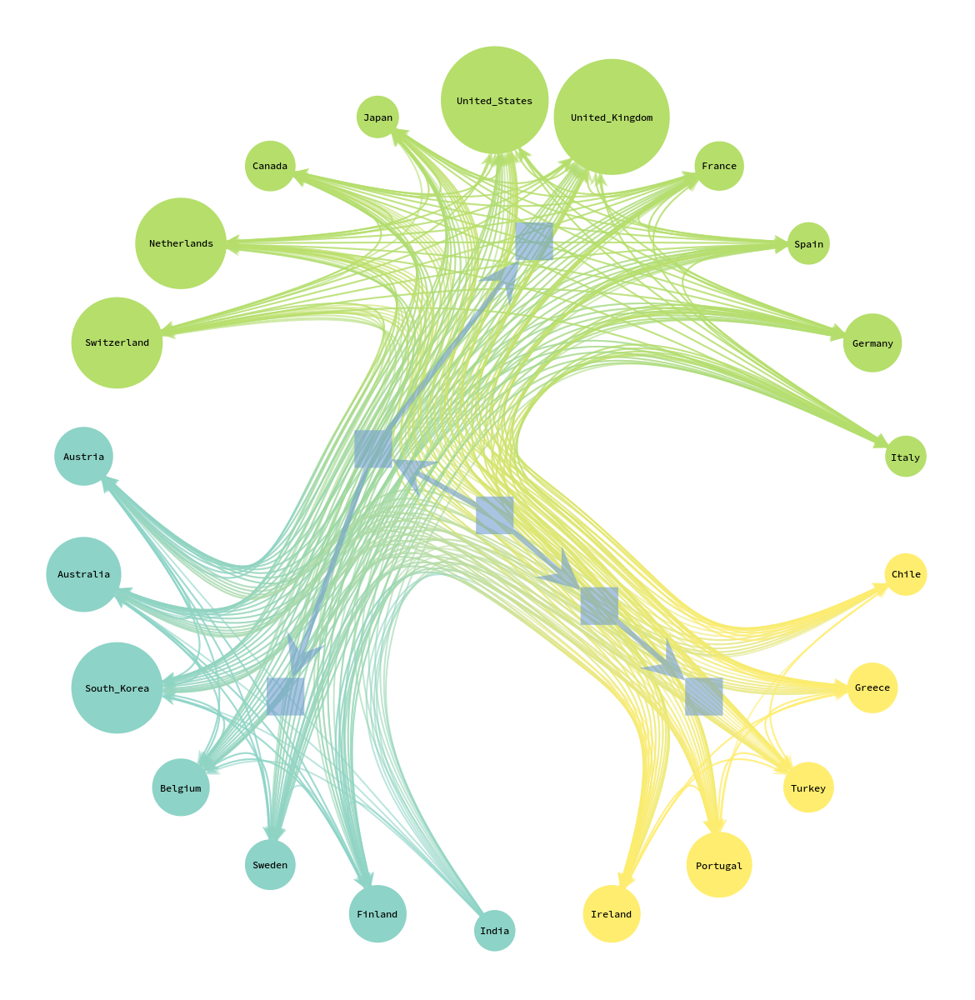

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc80a221940, at 0x7fc80a391910>,
 <GraphView object, directed, with 28 vertices and 27 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fc8180cef10, at 0x7fc809259ac0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fc8180cef10, at 0x7fc8092599a0>, False), at 0x7fc8180cef10>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc8180cef10, at 0x7fc809259160>)

In [61]:
index_20190331 = np.argmin(entropys_20190331)
states_20190331[index_20190331].draw(vertex_text = G_20190331.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

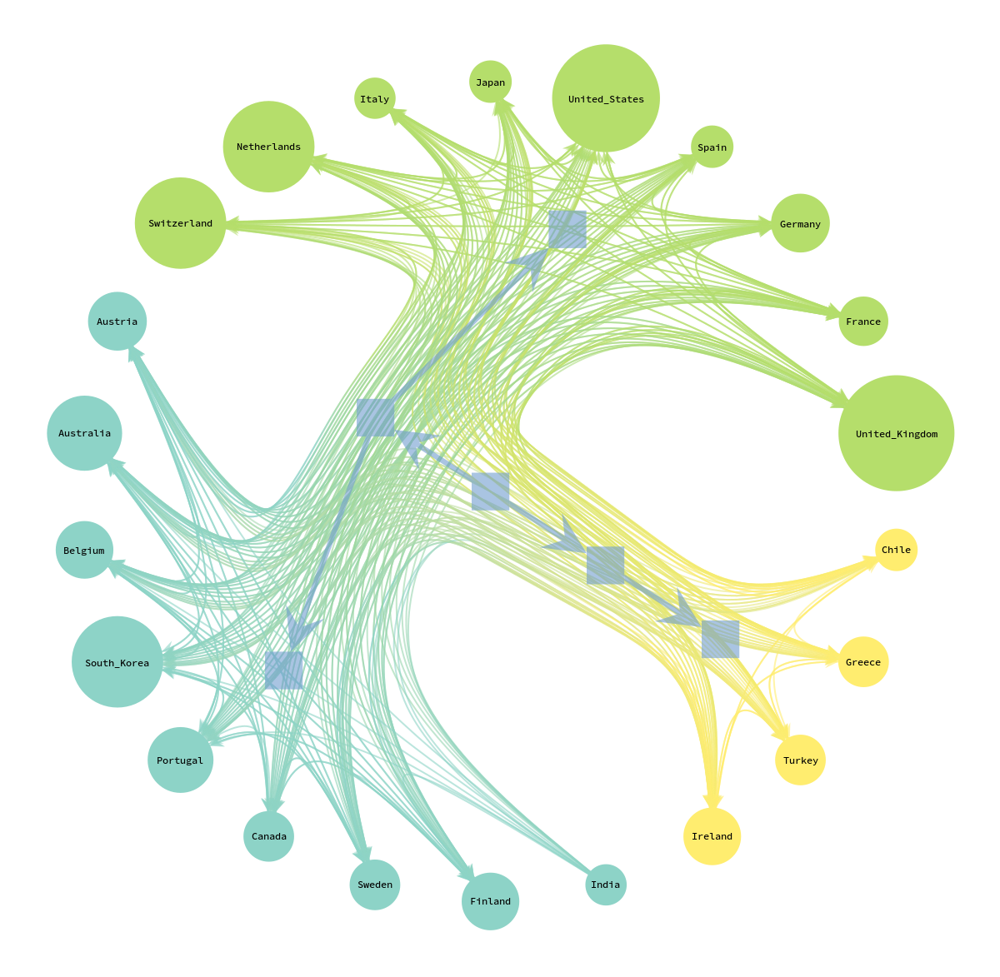

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc80a2144f0, at 0x7fc809256d00>,
 <GraphView object, directed, with 28 vertices and 27 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fc80a412b50, at 0x7fc80925e850>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fc80a412b50, at 0x7fc80925eaf0>, False), at 0x7fc80a412b50>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc80a412b50, at 0x7fc80925ea60>)

In [62]:
index_20210331 = np.argmin(entropys_20210331)
states_20210331[index_20210331].draw(vertex_text = G_20210331.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

##### Analyze Canada and Portugal

In [63]:
# Canada and Portugal
# Canada out
data_to_add = []
df_2019 = pd.DataFrame(columns=['out country', '20190331 claims_held', '20190331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20190331'].edges('Canada', data=True):
    data_to_add.append({'out country':des,
             '20190331 claims_held':attr_dict['claims_held'],
             '20190331 claims_held_norm':attr_dict['claims_held_norm']})
df_2019 = pd.concat([df_2019, pd.DataFrame(data_to_add)], ignore_index=True)

data_to_add = []
df_2021 = pd.DataFrame(columns=['out country', '20210331 claims_held', '20210331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20210331'].edges('Canada', data=True):
    data_to_add.append({'out country':des,
             '20210331 claims_held':attr_dict['claims_held'],
             '20210331 claims_held_norm':attr_dict['claims_held_norm']})
df_2021 = pd.concat([df_2021, pd.DataFrame(data_to_add)], ignore_index=True)

df_Canada_out = df_2019.merge(df_2021, how='outer', on=['out country'])
df_Canada_out['claims_diff'] = df_Canada_out['20210331 claims_held'] - df_Canada_out['20190331 claims_held']
df_Canada_out[['out country',
           '20190331 claims_held','20210331 claims_held',
           '20190331 claims_held_norm','20210331 claims_held_norm',
           'claims_diff']]

,out country,20190331 claims_held,20210331 claims_held,20190331 claims_held_norm,20210331 claims_held_norm,claims_diff
0,Austria,1.326616,1.791729,0.002989,0.003174,0.465113
1,Australia,11.312021,13.157539,0.025485,0.023306,1.845518
2,Belgium,3.325,4.83,0.007491,0.008555,1.505
3,Switzerland,23.986149,29.811022,0.054038,0.052805,5.824873
4,Chile,0.059385,0.029754,0.000134,0.000053,-0.029631
5,Germany,34.167,38.868,0.076975,0.068847,4.701
6,Spain,4.715695,5.201965,0.010624,0.009214,0.48627
7,Finland,3.066,3.532,0.006907,0.006256,0.466
8,France,30.368,36.636,0.068416,0.064894,6.268
9,United_Kingdom,99.638,127.598,0.224474,0.226015,27.96


In [64]:
# Canada in
data_to_add = []
df_2019 = pd.DataFrame(columns=['in country', '20190331 claims_held', '20190331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20190331'].in_edges('Canada', data=True):
    data_to_add.append({'in country':src,
             '20190331 claims_held':attr_dict['claims_held'],
             '20190331 claims_held_norm':attr_dict['claims_held_norm']})
df_2019 = pd.concat([df_2019, pd.DataFrame(data_to_add)], ignore_index=True)

data_to_add = []
df_2021 = pd.DataFrame(columns=['in country', '20210331 claims_held', '20210331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20210331'].in_edges('Canada', data=True):
    data_to_add.append({'in country':src,
             '20210331 claims_held':attr_dict['claims_held'],
             '20210331 claims_held_norm':attr_dict['claims_held_norm']})
df_2021 = pd.concat([df_2021, pd.DataFrame(data_to_add)], ignore_index=True)

df_Canada_in = df_2019.merge(df_2021, how='outer', on=['in country'])
df_Canada_in['claims_diff'] = df_Canada_in['20210331 claims_held'] - df_Canada_in['20190331 claims_held']
df_Canada_in[['in country',
           '20190331 claims_held','20210331 claims_held',
           '20190331 claims_held_norm','20210331 claims_held_norm',
           'claims_diff']]

,in country,20190331 claims_held,20210331 claims_held,20190331 claims_held_norm,20210331 claims_held_norm,claims_diff
0,Australia,21.147346,22.575065,0.048379,0.04182,1.427719
1,Austria,1.919362,2.327722,0.010432,0.010121,0.40836
2,Belgium,2.263015,1.546472,0.005943,0.00343,-0.716543
3,Switzerland,8.984105,15.117394,0.024047,0.036245,6.133289
4,Germany,32.363637,25.810481,0.023281,0.014946,-6.553156
5,Spain,1.732413,2.006919,0.004242,0.004009,0.274506
6,Finland,2.367553,2.398883,0.017422,0.015812,0.03133
7,France,25.279107,32.708234,0.020607,0.021706,7.429127
8,United_Kingdom,126.916,182.298,0.05601,0.072208,55.382
9,Ireland,30.934869,39.82974,0.07116,0.07394,8.894871


In [65]:
# Portugal out
data_to_add = []
df_2019 = pd.DataFrame(columns=['out country', '20190331 claims_held', '20190331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20190331'].edges('Portugal', data=True):
    data_to_add.append({'out country':des,
             '20190331 claims_held':attr_dict['claims_held'],
             '20190331 claims_held_norm':attr_dict['claims_held_norm']})
df_2019 = pd.concat([df_2019, pd.DataFrame(data_to_add)], ignore_index=True)

data_to_add = []
df_2021 = pd.DataFrame(columns=['out country', '20210331 claims_held', '20210331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20210331'].edges('Portugal', data=True):
    data_to_add.append({'out country':des,
             '20210331 claims_held':attr_dict['claims_held'],
             '20210331 claims_held_norm':attr_dict['claims_held_norm']})
df_2021 = pd.concat([df_2021, pd.DataFrame(data_to_add)], ignore_index=True)

df_Portugal_out = df_2019.merge(df_2021, how='outer', on=['out country'])
df_Portugal_out['claims_diff'] = df_Portugal_out['20210331 claims_held'] - df_Portugal_out['20190331 claims_held']
df_Portugal_out[['out country',
           '20190331 claims_held','20210331 claims_held',
           '20190331 claims_held_norm','20210331 claims_held_norm',
           'claims_diff']]

,out country,20190331 claims_held,20210331 claims_held,20190331 claims_held_norm,20210331 claims_held_norm,claims_diff
0,Austria,0.362732,0.362664,0.002408,0.002042,-0.000068
1,Australia,0.011246,0.10485,0.000075,0.00059,0.093604
2,Belgium,0.46,0.559,0.003053,0.003148,0.099
3,Germany,9.92,8.905,0.065847,0.050143,-1.015
4,Spain,105.147,124.96,0.697946,0.703637,19.813
5,Finland,0.048,0.137,0.000319,0.000771,0.089
6,France,18.722,25.021,0.124273,0.140891,6.299
7,United_Kingdom,1.667,1.082,0.011065,0.006093,-0.585
8,Greece,0.367,0.469,0.002436,0.002641,0.102
9,Ireland,0.572673,1.257716,0.003801,0.007082,0.685043


In [66]:
# Portugal in
data_to_add = []
df_2019 = pd.DataFrame(columns=['in country', '20190331 claims_held', '20190331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20190331'].in_edges('Portugal', data=True):
    data_to_add.append({'in country':src,
             '20190331 claims_held':attr_dict['claims_held'],
             '20190331 claims_held_norm':attr_dict['claims_held_norm']})
df_2019 = pd.concat([df_2019, pd.DataFrame(data_to_add)], ignore_index=True)

data_to_add = []
df_2021 = pd.DataFrame(columns=['in country', '20210331 claims_held', '20210331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20210331'].in_edges('Portugal', data=True):
    data_to_add.append({'in country':src,
             '20210331 claims_held':attr_dict['claims_held'],
             '20210331 claims_held_norm':attr_dict['claims_held_norm']})
df_2021 = pd.concat([df_2021, pd.DataFrame(data_to_add)], ignore_index=True)

df_Portugal_in = df_2019.merge(df_2021, how='outer', on=['in country'])
df_Portugal_in['claims_diff'] = df_Portugal_in['20210331 claims_held'] - df_Portugal_in['20190331 claims_held']
df_Portugal_in[['in country',
           '20190331 claims_held','20210331 claims_held',
           '20190331 claims_held_norm','20210331 claims_held_norm',
           'claims_diff']]

,in country,20190331 claims_held,20210331 claims_held,20190331 claims_held_norm,20210331 claims_held_norm,claims_diff
0,Australia,0.136822,0.078891,0.000313,0.000146,-0.057931
1,Austria,0.1844,0.303853,0.001002,0.001321,0.119453
2,Belgium,0.553313,0.351384,0.001453,0.000779,-0.201929
3,Canada,0.124766,0.132552,0.000281,0.000235,0.007786
4,Switzerland,1.819297,2.225883,0.00487,0.005337,0.406586
5,Chile,0.045116,0.059417,0.000529,0.000644,0.014301
6,Germany,2.474712,2.717083,0.00178,0.001573,0.242371
7,Spain,18.480084,16.967643,0.045247,0.033891,-1.512441
8,Finland,0.201811,0.315824,0.001485,0.002082,0.114013
9,France,5.711607,7.065255,0.004656,0.004689,1.353648


In [67]:
# Italy out
data_to_add = []
df_2019 = pd.DataFrame(columns=['out country', '20190331 claims_held', '20190331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20190331'].edges('Italy', data=True):
    data_to_add.append({'out country':des,
             '20190331 claims_held':attr_dict['claims_held'],
             '20190331 claims_held_norm':attr_dict['claims_held_norm']})
df_2019 = pd.concat([df_2019, pd.DataFrame(data_to_add)], ignore_index=True)

data_to_add = []
df_2021 = pd.DataFrame(columns=['out country', '20210331 claims_held', '20210331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20210331'].edges('Italy', data=True):
    data_to_add.append({'out country':des,
             '20210331 claims_held':attr_dict['claims_held'],
             '20210331 claims_held_norm':attr_dict['claims_held_norm']})
df_2021 = pd.concat([df_2021, pd.DataFrame(data_to_add)], ignore_index=True)

df_Italy_out = df_2019.merge(df_2021, how='outer', on=['out country'])
df_Italy_out['claims_diff'] = df_Italy_out['20210331 claims_held'] - df_Italy_out['20190331 claims_held']
df_Italy_out[['out country',
           '20190331 claims_held','20210331 claims_held',
           '20190331 claims_held_norm','20210331 claims_held_norm',
           'claims_diff']]

,out country,20190331 claims_held,20210331 claims_held,20190331 claims_held_norm,20210331 claims_held_norm,claims_diff
0,Austria,4.919401,5.453861,0.007194,0.007013,0.53446
1,Australia,0.227788,0.390702,0.000333,0.000502,0.162914
2,Belgium,4.75,4.02,0.006946,0.005169,-0.73
3,Canada,1.574582,0.495262,0.002303,0.000637,-1.07932
4,Switzerland,15.549292,17.14311,0.022739,0.022044,1.593818
5,Chile,0.006028,0.005978,0.000009,0.000008,-0.00005
6,Germany,89.776,89.87,0.131288,0.115561,0.094
7,Spain,74.76027,109.265,0.109329,0.140501,34.50473
8,Finland,0.184,NaN,0.000269,NaN,NaN
9,France,327.308,372.293,0.478652,0.47872,44.985


In [68]:
# Italy in
data_to_add = []
df_2019 = pd.DataFrame(columns=['in country', '20190331 claims_held', '20190331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20190331'].in_edges('Italy', data=True):
    data_to_add.append({'in country':src,
             '20190331 claims_held':attr_dict['claims_held'],
             '20190331 claims_held_norm':attr_dict['claims_held_norm']})
df_2019 = pd.concat([df_2019, pd.DataFrame(data_to_add)], ignore_index=True)

data_to_add = []
df_2021 = pd.DataFrame(columns=['in country', '20210331 claims_held', '20210331 claims_held_norm'])
for src, des, attr_dict in G_nxs_feature['20210331'].in_edges('Italy', data=True):
    data_to_add.append({'in country':src,
             '20210331 claims_held':attr_dict['claims_held'],
             '20210331 claims_held_norm':attr_dict['claims_held_norm']})
df_2021 = pd.concat([df_2021, pd.DataFrame(data_to_add)], ignore_index=True)

df_Italy_in = df_2019.merge(df_2021, how='outer', on=['in country'])
df_Italy_in['claims_diff'] = df_Italy_in['20210331 claims_held'] - df_Italy_in['20190331 claims_held']
df_Italy_in[['in country',
           '20190331 claims_held','20210331 claims_held',
           '20190331 claims_held_norm','20210331 claims_held_norm',
           'claims_diff']]

,in country,20190331 claims_held,20210331 claims_held,20190331 claims_held_norm,20210331 claims_held_norm,claims_diff
0,Australia,1.147752,2.397472,0.002626,0.004441,1.24972
1,Austria,80.254893,106.797,0.436211,0.464374,26.542107
2,Belgium,8.917215,12.505413,0.023419,0.027738,3.588198
3,Canada,2.479197,2.956778,0.005585,0.005237,0.477581
4,Switzerland,15.239844,18.580399,0.040792,0.044548,3.340555
5,Chile,0.349842,NaN,0.004099,NaN,NaN
6,Germany,167.188,230.738,0.120266,0.133614,63.55
7,Spain,62.303733,86.446939,0.152547,0.172667,24.143206
8,Finland,1.936336,2.85662,0.014249,0.018829,0.920284
9,France,63.310806,68.394058,0.051609,0.045388,5.083252


Filtered network: 61 edges remain out of 407


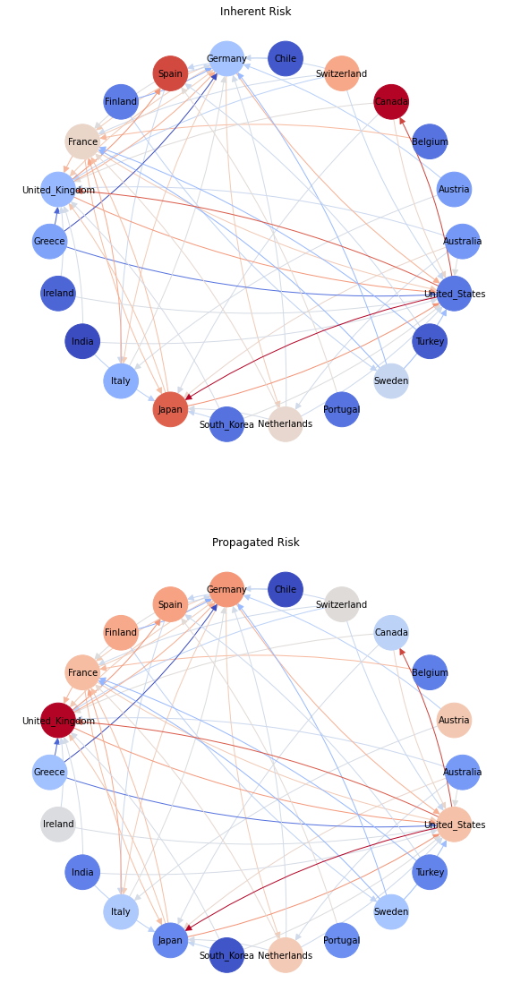

In [69]:
# see the risk distribution
G_temp = G_nxs_feature['20190331']

def disparity_filter(G, alpha):
    s = G.out_degree(weight = 'claims_held')
    k = G.out_degree(weight = None)

    def pij(i, j):
        w = G.edges[i, j]['claims_held']
        return ((1 - (w / s[i])) ** (k[i] - 1)) < alpha

    return nx.subgraph_view(G, filter_edge = pij)


G_filt = disparity_filter(G_temp, .1)
print('Filtered network:', len(G_filt.edges), 'edges remain out of', len(G_temp.edges))

plt.figure(3, figsize = (10, 20))
plt.subplot(2, 1, 1)
plt.title('Inherent Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('inherent_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")

plt.subplot(2, 1, 2)
plt.title('Propagated Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('propagated_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")
plt.show()

In [70]:
pd.DataFrame({
    'inherent_risk': [id for id,  wgt in sorted(G_filt.nodes.data('inherent_risk'), key = lambda p: -p[1])][:15],
    'propagated': [id for id,  wgt in sorted(G_filt.nodes.data('propagated_risk'), key = lambda p: -p[1])][:15]
}).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
inherent_risk,Canada,Spain,Japan,Switzerland,France,Netherlands,Sweden,Germany,United_Kingdom,Italy,Greece,Austria,Australia,Finland,United_States
propagated,United_Kingdom,Germany,Spain,Finland,France,United_States,Austria,Netherlands,Switzerland,Ireland,Canada,Italy,Sweden,Greece,Australia


In [71]:
print(G_nxs_feature['20190331'].nodes['Canada'])
print(G_nxs_feature['20210331'].nodes['Canada'])
print(G_nxs_feature['20190331'].nodes['Portugal'])
print(G_nxs_feature['20210331'].nodes['Portugal'])
print(G_nxs_feature['20190331'].nodes['United_States'])
print(G_nxs_feature['20210331'].nodes['United_States'])

{'inherent_risk': 3.3381755613391912, 'propagated_risk': 0.04460473905587458}
{'inherent_risk': 3.279436230223105, 'propagated_risk': 0.04292556774093095}
{'inherent_risk': 0.3078149345402036, 'propagated_risk': 0.03457135581398739}
{'inherent_risk': 0.30144023477885445, 'propagated_risk': 0.03807989137416631}
{'inherent_risk': 0.34856712915498195, 'propagated_risk': 0.055509450386075215}
{'inherent_risk': 0.3604048114384204, 'propagated_risk': 0.05387045039652726}


## Dynamic Analysis

### Inherent and Propagated Risks

In [72]:
G_origin = G_nxs_feature['20210331']
G_remove = G_origin.copy()

In [73]:
G_remove.remove_node('Japan')
G_remove.remove_node('Canada')
G_remove.remove_node('Spain')
G_remove.remove_node('Switzerland')
G_remove.remove_node('Netherlands')

In [74]:
print("nodes: ", nx.number_of_nodes(G_remove))
print("edges: ", nx.number_of_edges(G_remove))

nodes:  17
edges:  241


In [75]:
# recalculate: lose out-strength, with old in-strength
print("***process")
in_strength = G_origin.in_degree(weight = 'claims_held')
out_strength = G_remove.out_degree(weight = 'claims_held')
# add norm
for src, tar, wgt in G_remove.edges.data('claims_held'):
    G_remove.edges[src, tar]['claims_held_norm'] = wgt / out_strength[src]
    G_remove.edges[src, tar]['claims_held_norm_reciprocal'] = 1 / G_remove.edges[src, tar]['claims_held_norm']
# add inherent risk
for node in list(G_remove.nodes(data=False)):
    G_remove.nodes[node]['inherent_risk'] = in_strength[node] / out_strength[node]
# add propagated risk
propagated_risk = nx.pagerank(G = G_remove.reverse(), # The borrower has higher risk, so change the direction
                                  nstart = dict(G_remove.nodes.data('inherent_risk')),
                                  weight = 'claims_held_norm')
for node in list(G_remove.nodes(data=False)):
    G_remove.nodes[node]['propagated_risk'] = propagated_risk[node]
nx.write_graphml_lxml(G_remove, "20210331_remove.graphml")
print("***finish")

***process
***finish


Filtered network: 39 edges remain out of 241


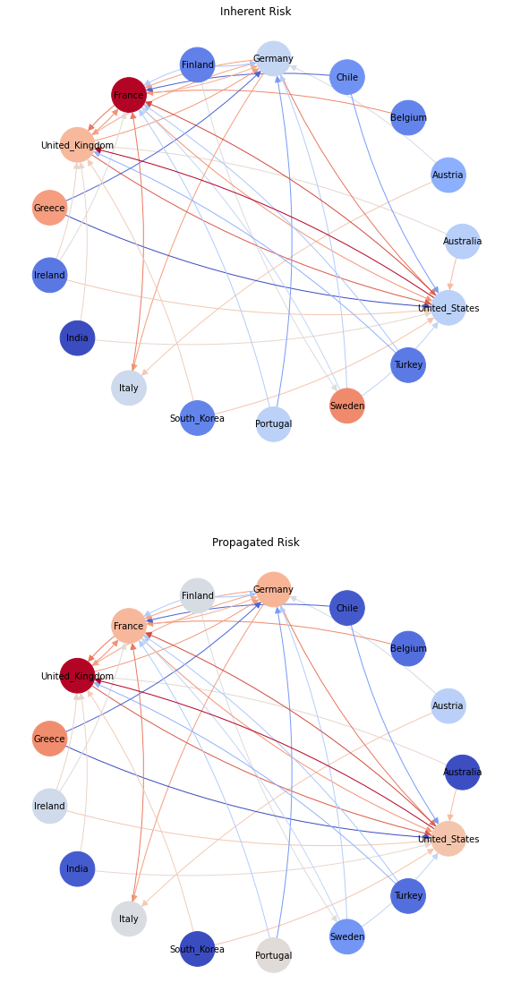

In [76]:
def disparity_filter(G, alpha):
    s = G.out_degree(weight = 'claims_held')
    k = G.out_degree(weight = None)

    def pij(i, j):
        w = G.edges[i, j]['claims_held']
        return ((1 - (w / s[i])) ** (k[i] - 1)) < alpha

    return nx.subgraph_view(G, filter_edge = pij)


G_filt = disparity_filter(G_remove, .1)
print('Filtered network:', len(G_filt.edges), 'edges remain out of', len(G_remove.edges))

plt.figure(3, figsize = (10, 20))
plt.subplot(2, 1, 1)
plt.title('Inherent Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('inherent_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")

plt.subplot(2, 1, 2)
plt.title('Propagated Risk')
nx.draw(
  G_filt,
  pos = nx.circular_layout(G_filt),
  node_size=1500,
  node_color = [wgt for _, wgt in G_filt.nodes.data('propagated_risk')],
  cmap = mpl.cm.coolwarm,
  with_labels = True,
  font_color = 'black',
  font_size = 10,
  edge_color = [np.log(wgt) for _, _, wgt in G_filt.edges.data('claims_held')],
  edge_cmap = mpl.cm.coolwarm,
  arrowsize = 15,
  connectionstyle="arc3,rad=0.1")
plt.show()

In [77]:
pd.DataFrame({
    'inherent_risk_before_deletion': [(id, wgt) for id,  wgt in sorted(G_origin.nodes.data('inherent_risk'), key = lambda p: -p[1])][:10],
    'inherent_risk_after_deletion': [(id, wgt) for id,  wgt in sorted(G_remove.nodes.data('inherent_risk'), key = lambda p: -p[1])][:10],
    'propagated_risk_before_deletion': [(id, wgt) for id,  wgt in sorted(G_origin.nodes.data('propagated_risk'), key = lambda p: -p[1])][:10],
    'propagated_risk_after_deletion': [(id, wgt) for id,  wgt in sorted(G_remove.nodes.data('propagated_risk'), key = lambda p: -p[1])][:10]
})

,inherent_risk_before_deletion,inherent_risk_after_deletion,propagated_risk_before_deletion,propagated_risk_after_deletion
0,"(Canada, 3.279436230223105)","(France, 2.819779165253216)","(United_Kingdom, 0.0692381146915677)","(United_Kingdom, 0.09543567721705071)"
1,"(Spain, 2.8982666368586854)","(Sweden, 2.220080819270625)","(Spain, 0.06850635252576369)","(Greece, 0.08241168605425063)"
2,"(Japan, 2.871092610464302)","(Greece, 2.082681121519881)","(Greece, 0.05982975073514005)","(Germany, 0.07645097147100623)"
3,"(Switzerland, 2.4237244451641877)","(United_Kingdom, 1.8783333937463362)","(Germany, 0.0584028473434621)","(France, 0.07594001298782484)"
4,"(Netherlands, 2.006200687678921)","(Italy, 1.2450947577997007)","(France, 0.055099320772883945)","(United_States, 0.07315915235061783)"
5,"(France, 1.8393602113378291)","(Germany, 1.1689268482463466)","(Finland, 0.05503877576059898)","(Portugal, 0.06666071637125452)"
6,"(Greece, 1.744085786388376)","(Portugal, 1.0881602905207552)","(Netherlands, 0.05492860343159948)","(Italy, 0.06503683206275343)"
7,"(Sweden, 1.6880519661675164)","(United_States, 1.081108193987226)","(United_States, 0.05387045039652726)","(Finland, 0.06452570694165613)"
8,"(United_Kingdom, 1.012396006676269)","(Australia, 1.0509549081343135)","(Ireland, 0.04995740986990863)","(Ireland, 0.06297460599915577)"
9,"(Italy, 0.9163581915535357)","(Austria, 0.7027345048263981)","(Austria, 0.048390898919203604)","(Austria, 0.05891658977795809)"


### Communities

In [78]:
G_temp = gt.load_graph("20210331_remove.graphml")

In [79]:
entropys = []
states = []
for i in range(10):
    state = gt.minimize_nested_blockmodel_dl(G_temp,
              state_args=dict(recs=[G_temp.properties[('e', 'claims_held')]], rec_types=["real-exponential"]))
    entropys.append(state.entropy())
    states.append(state)
pd.DataFrame({'entropys': entropys}).describe()

,entropys
count,10.000000
mean,1068.025150
std,37.999594
min,1050.155279
25%,1050.155279
50%,1052.570679
75%,1066.777471
max,1172.854414


1
1050.1552793425947


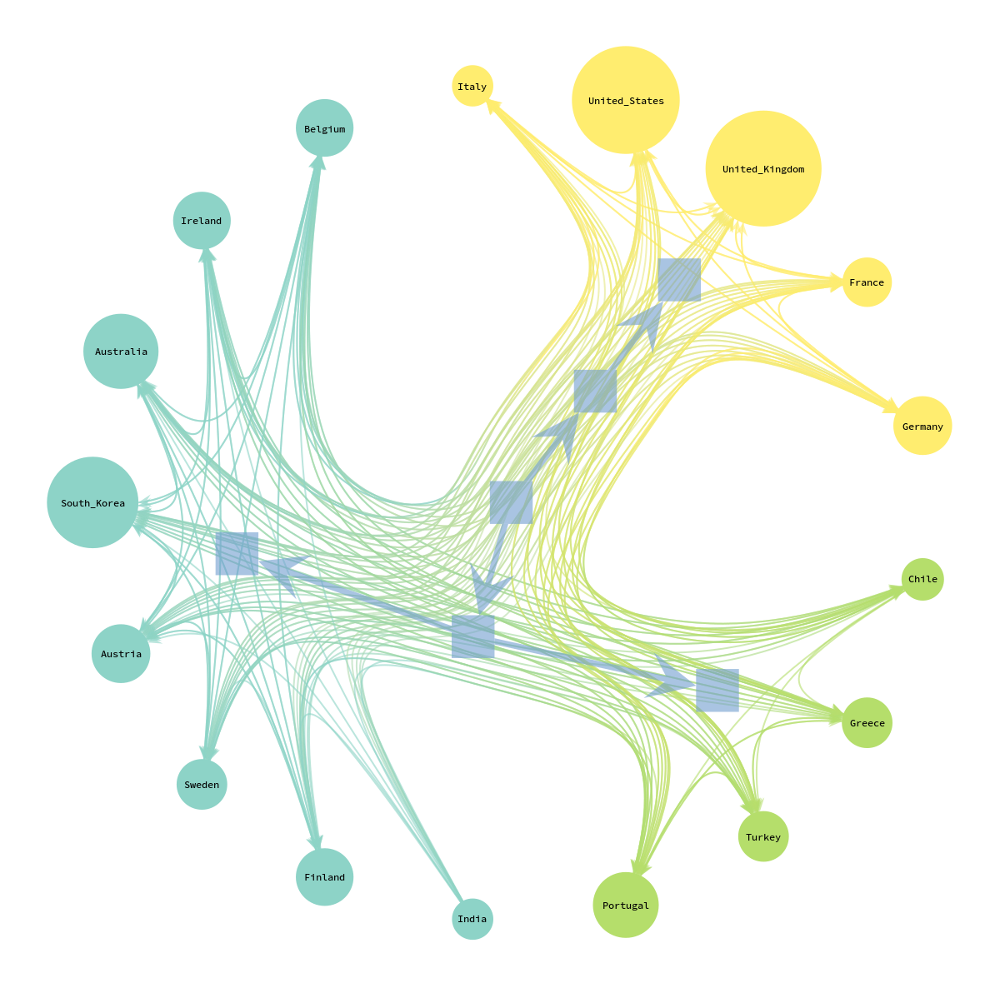

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc8090e59a0, at 0x7fc8091f8eb0>,
 <GraphView object, directed, with 23 vertices and 22 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fc8091f82e0, at 0x7fc809260be0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fc8091f82e0, at 0x7fc809260f40>, False), at 0x7fc8091f82e0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc8091f82e0, at 0x7fc809260eb0>)

In [80]:
index = np.argmin(entropys)
print(index)
print(entropys[index])
states[index].draw(vertex_text = G_temp.properties[('v', '_graphml_vertex_id')],
              vertex_size = 10)

In [81]:
G_filt.out_edges('Portugal', data = 'claims_held_norm')

OutEdgeDataView([('Portugal', 'Germany', 0.18101038635767505), ('Portugal', 'France', 0.5085975156715764)])

In [82]:
G_filt.out_edges('Ireland', data = 'claims_held_norm')

OutEdgeDataView([('Ireland', 'France', 0.1834157925779371), ('Ireland', 'United_Kingdom', 0.24105556326413083), ('Ireland', 'United_States', 0.3195601801260412)])

# End